# Data Reduction Final Report
    Aurellio Deandra

In this report, basic data reduction and aperture photometry of some AGNs were performed with Python, with extensive use of astropy and photutils module. The data was obtained in Vidojevica at 22nd of October 2023 with the 1.4 Milankovic telescope. Six filters were used: B, V, R, Ha, SII, and red-continuum. Objects observed are as follow:

1. Mrk335
    - 00 06 19 || +20 12 10 || V=13.85
2. Mrk6
    - 06 52 12 || +74 25 37 || V=14.19
3. Mrk817
    - 14 36 22 || +58 47 39 || V=12.80

# Data Reduction Part

## Preliminary Importing and Path Defining
The imports are copied from https://github.com/anavudragovic/vidojevica, with some added modifications

In [1]:
## importing

import sys
import os
import glob
#import fnmatch

from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
from photutils.segmentation import SegmentationImage   
#from astropy.visualization import simple_norm
#from astropy import stats as astrostats
from astropy.stats import sigma_clipped_stats
from astropy.wcs import WCS
#from astropy.visualization import SqrtStretch
#from astropy.visualization.mpl_normalize import ImageNormalize
#from astropy.stats import SigmaClip
#from photutils import Background2D, MedianBackground
#from photutils import BkgZoomInterpolator
from astropy.visualization import simple_norm
from scipy.ndimage import gaussian_filter
import sep

from photutils.aperture import CircularAperture, CircularAnnulus
from photutils.aperture import aperture_photometry
from photutils.aperture import ApertureStats

As of photutils version 1.17.0, make_source_mask function is depcrecated in favor of SegmentationImage.make_source_mask. Further modification has to be performed to the code since make_source_mask and SegmentationImage.make_source_mask need different keywords and method...

Alternatively, the section that needs make_source_mask may not be used at all...

### Naming Conventions

The naming convention for the frames are as follows:

1. bias frame = biasZalaz-{number}.fit
2. flat frame = flatZalaz-5sec-{number}-{filter}.fit
3. dark frame 
    1. science = scDarkZalaz-200s-{number}.fit
    2. flat = darkZalaz-5sec-{number}.fit
    
4. object frames = {OBJECT}-{4digit_number}-{filter}.fit

In [2]:
#Path and names defining

path = r'C:\__Programming\__MassS3\Data_reduction\Final_Report\Vidojevica_Spectra' # path the directory containing all images
os.chdir(path) #change the directory

bias_names="bias*.fit" # how to identify the bias images by file name. 

dark_for_science_names="scDarkZalaz-200sec-*.fit" # dark images for science images.
dark_for_flats_names="darkZalaz-5sec*.fit" #dark images for flats.


#Comment from original pipeline author

# I did this naming convention because the telescope pipeline doesn't include astrometry, which therefore needed
# to be done separately. To keep everything in one folder, I added "wcs" to the file name and search for it
# in this name query. Of course there are smarter ways to do this, but it works.

The flat frames and the science objects are differentiated due to the filters.

In [3]:
flat_filter = ['B', 'Ha','HaContinuum', 'R', 'SII', 'V']
science_filter = ['B', 'Ha','cnt', 'R', 'SII', 'V']

#making this a list due to different filters
flat_names_filter = []

#there are three science objects
Mrk6_names_filter = []
Mrk335_names_filter = []
Mrk817_names_filter = []


for i in range(len(flat_filter)):
    flat_names_filter.append("flatZalaz-5sec-*_{}.fit".format(flat_filter[i]))
    
    Mrk6_names_filter.append("Mrk6*_{}.fit".format(science_filter[i]))
    Mrk335_names_filter.append("Mrk335*_{}.fit".format(science_filter[i]))
    Mrk817_names_filter.append("Mrk817*_{}.fit".format(science_filter[i]))

## Dark Frames : Exposure Time Checking

Ideally, Dark frames has the same exposure time as the science frame. The naming convention on the flats and the dark frames include the exposure time. However, the science frames does not have the exposure time written on the filename. Fortunately, exposure time can be obtained by checking the header of the .fit files.

In [4]:
# checking the header convention for one of the already specified frames
hdul = fits.open("scDarkZalaz-200sec-1.fit")
hdr = hdul[0].header
hdr

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-14T16:28:14' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   200.00000000000000 /Exposure time in seconds                        
EXPOSURE=   200.00000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

Two parameters are set as exposure time. It is assumed that these two parameter names are the same for all of the .fit image, with the values of EXPTIME and EXPOSURE are assumed to be the same for all .fit image. In addition, since the dark frames has the exposure time typed on its filename, it is assumed that the exposure time is the one written on the filename (200s for science dark frame; 5s for flat dark frame, the same as the flat frame filenames)

In [5]:
# checking the exposure time of one of the science objects
fits_to_open = "Mrk335-0001_V.fit"
hdul = fits.open(fits_to_open)
hdr = hdul[0].header
print ('exposure time of {} = {} sec'.format(fits_to_open, hdr['EXPOSURE']))

exposure time of Mrk335-0001_V.fit = 150.0 sec


Unfortunately, the science frame has different exposure time as the dark frame. This problem worsens as different filters and different objects has different exposure time. 

The main pipeline code also encounters this problem. Their solution was to assume the CCD has a linear count to exposure time relation. This assumption is supported by Widenhorn, et al. (2010). Therefore, this assumption is also used in this project too by variating the dark to science ratio, depending on the science frames of each objects and filter.

In [6]:
#making the function for the ratio

def dark_ratio (frame, flat_science = 'science'):

# frame = the filename of the fit file to be evaluated
# flat_science = is the frame a flat frame or science frame? (string, "flat" for flat, "science" or science)
# default is science, since only the science has differing exp time (so far)

    if flat_science == "flat":
        dark_exp = 5.
    
    elif flat_science == "science":
        dark_exp = 200.
    
    open_frame = fits.open(frame)
    hdr = open_frame[0].header
    
    frame_exp = hdr['EXPOSURE']
    
    frame_to_dark_ratio = (frame_exp / dark_exp)
    
    return frame_to_dark_ratio

In [7]:
dark_ratio("Mrk335-0001_B.fit")

1.2

## Master Frames

With the dark frame issue addressed, the next step is to take master frames. each of bias, dark, and flat frames need to be treated differently, but in the end, the average of multiple images are taken. The pipeline suggests taking the median value of every frames for each pixels.

The master of bias frames are quite straight forward, which is the average of every bias frames taken.

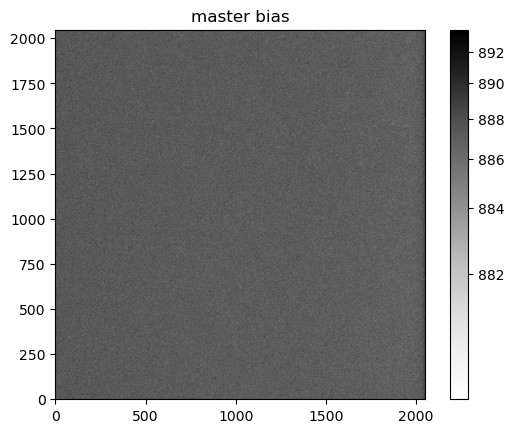

In [8]:
#Master Bias and visualizing 

biases = []
for file in glob.glob(bias_names):
    biases.append(fits.open(file)[0].data)
biases = np.array(biases)
master_bias = np.median(biases, axis=0)

norm = simple_norm(master_bias,'sqrt',percent=99)
plt.title("master bias")
plt.imshow(master_bias,norm=norm,cmap = 'Greys', origin='lower')
plt.colorbar()

Bias frames has to be substracted from the bias frame before averaging the result to create the master dark frames. Two master dark frames were created, one for the science frames (with 200sec exposure time) and one for the flat frames (with 5sec exposure time).

Note the large master bias value. This will come up later.

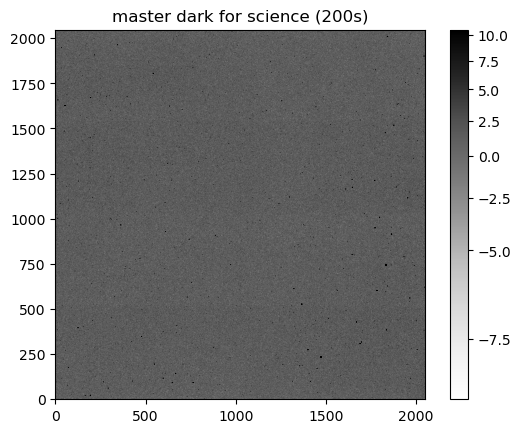

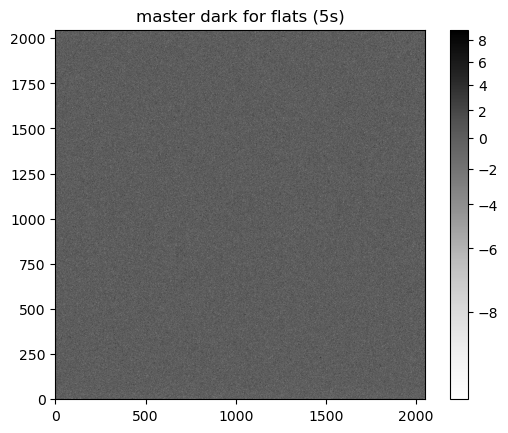

In [9]:
#Master dark and visualizing it

def master_dark_fct (file_names):
    dummy = []
    for file in glob.glob(file_names):
        dummy.append(fits.open(file)[0].data-master_bias)
    dummy = np.array(dummy)
    master_dark = np.median(dummy, axis=0)
    return master_dark

master_dark_science = master_dark_fct(dark_for_science_names)
master_dark_flats = master_dark_fct(dark_for_flats_names)

norm = simple_norm(master_dark_science,'sqrt',percent=99)
plt.title("master dark for science (200s)")
plt.imshow(master_dark_science, norm=norm, cmap = 'Greys', origin='lower')
plt.colorbar()
plt.show()

norm = simple_norm(master_dark_flats,'sqrt',percent=99)
plt.title("master dark for flats (5s)")
plt.imshow(master_dark_flats, norm=norm, cmap = 'Greys', origin='lower')
plt.colorbar()
plt.show()

Some of the pixel values are negatives. This is because of the bias value that is larger than the dark frame and the master dark frame is obtained by substracting with the bias frame. This is an issue that persist throughout the data, and will cause some problem along the way, especially the discrepancy of visualization and the data. This issue will be explored much further later down the report.

To create the flat frame, bias and the dark frames has to be substracted. Although the master dark for flat frames already substract the bias, the procedure only subtract the bias from the dark for flat frames, and therefore the flat frames still has the inherent bias frame.

After subtraction is done, the flat frame has to be normalized. The normalization in the pipeline, which this project follows, uses the average value. In general, the master dark follows this equation:

$$
  Flat_{Master} = \frac{Flat-Bias_{master}-Dark_{flat, master}}{\widetilde{(Flat-Bias_{master}-Dark_{flat, master})}}
$$

where $ \widetilde{x} $ denotes the median of $ x $.

In addition, the flats are different for each filters. Therefore, every flats is done

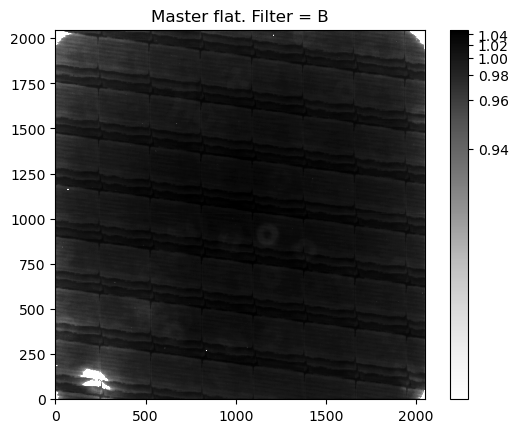

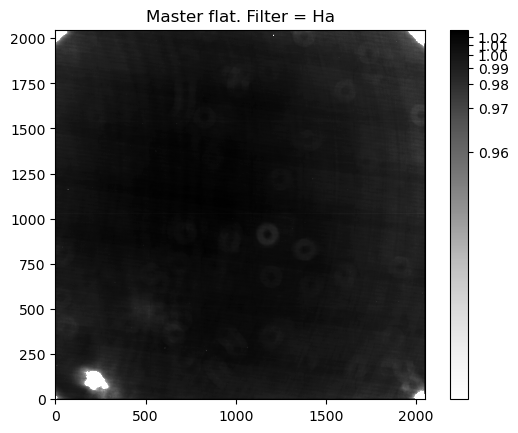

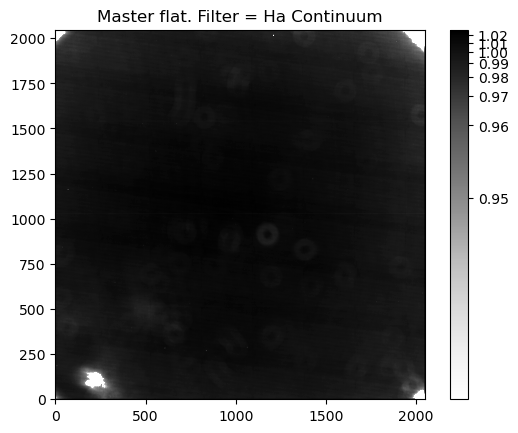

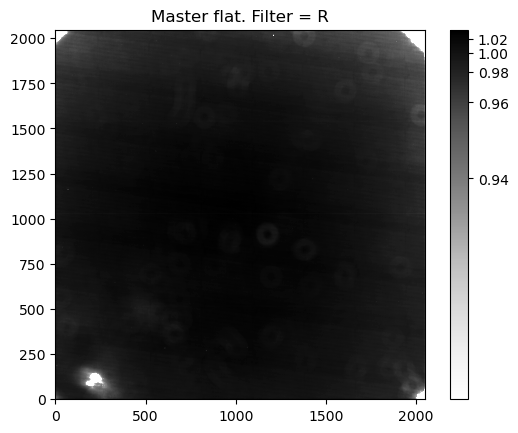

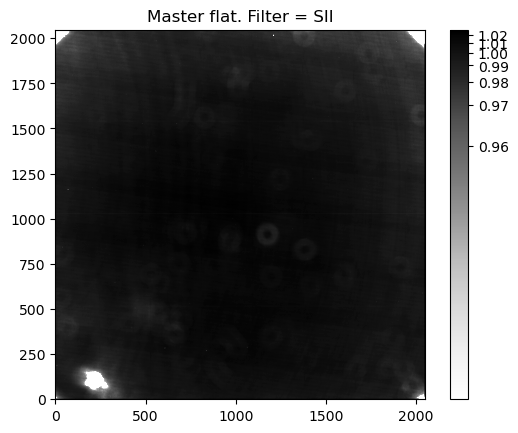

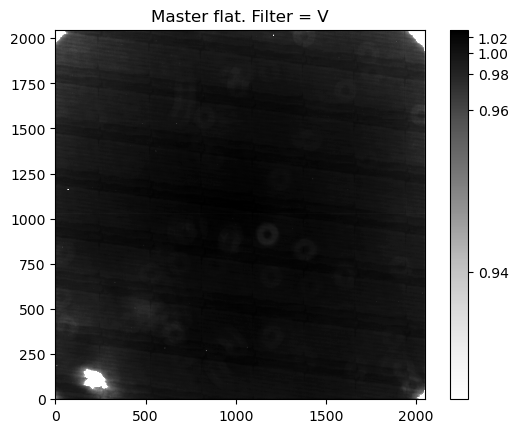

In [10]:
#master flats and visualizing the flats
def master_flats_fct (file_name):
    dummy = []
    for file in glob.glob(file_name):
        flat_db=fits.open(file)[0].data-master_bias-master_dark_flats 
        flat_norm=flat_db/np.median(flat_db)
        dummy.append(flat_norm)
    
    dummy = np.array(dummy)
    master_flat = np.median(dummy, axis=0)
    return master_flat
    
    
def filter_visualization (image, flat_final, flat_filter): 
    #to simplify, make a procedure
    #this will be used also for final reducted image, so include if it is flat or final reducted image
    
    norm = simple_norm(image, 'log', percent=99)
                                        # for images, log seems to be the one with better visualization
    plt.title ("{}. Filter = {}".format(flat_final, flat_filter))
    plt.imshow(image, norm=norm, cmap = 'Greys', origin='lower')
    plt.colorbar()
    plt.show()
    

# it's probably better to make a nested list, so only 1 variable is taken
# oh well... too bad
master_flat_B = master_flats_fct(flat_names_filter[0])
master_flat_Ha = master_flats_fct(flat_names_filter[1])
master_flat_HaCnt = master_flats_fct(flat_names_filter[2])
master_flat_R = master_flats_fct(flat_names_filter[3])
master_flat_SII = master_flats_fct(flat_names_filter[4])
master_flat_V = master_flats_fct(flat_names_filter[5])

filter_visualization(master_flat_B, 'Master flat', 'B')
filter_visualization(master_flat_Ha, 'Master flat', 'Ha')
filter_visualization(master_flat_HaCnt, 'Master flat', 'Ha Continuum')
filter_visualization(master_flat_R, 'Master flat', 'R')
filter_visualization(master_flat_SII, 'Master flat', 'SII')
filter_visualization(master_flat_V, 'Master flat', 'V')

## Science Frame Reduction
With all the master frames obtained, the reduction of science frame can be done using the following equation

$$
  Final = \frac{Science-Bias_{master}-Dark_{science-exp, master}}{Flat}
$$

The final image is then averaged. The dark frame has to be in the same exposure time. Since the dark is previously assumed to be linear, the following equation is used

$$
  Dark_{science-exp, master} = (\frac{T_{exp, science}}{T_{exp, dark}})Dark_{science, master}
$$

In [11]:
#reduction function defining (differs for each frames)

def reduction_fct (filename, science, flat):
    dark_rat = dark_ratio(filename)
    master_dark_rectified = dark_rat * master_dark_science
    
    numerator = science - master_bias - master_dark_rectified
    
    final_res = numerator/flat
    
    return final_res


def master_reduction_fct (filename, flat): #with stacking included
    dummy = []
    for file in glob.glob(filename):
        
        loaded=fits.open(file)[0].data
        reducted = reduction_fct(file, loaded, flat)
        
        dummy.append(reducted)
    
    dummy = np.array(dummy)
    
    #stacking and visualization
    red_sum = np.sum(dummy, axis=0)
    red_median = np.median(dummy, axis=0)
    master_red = red_sum/red_median
    
    return master_red


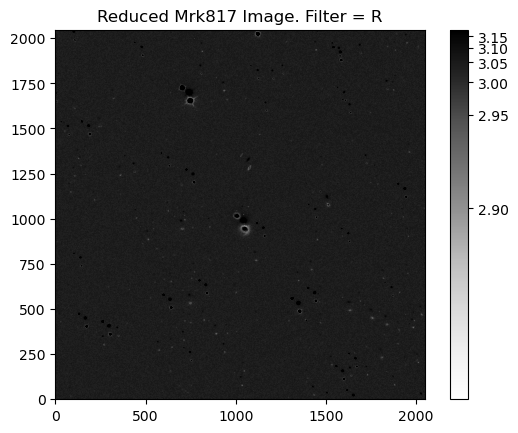

In [12]:
#testing the object with MRK817 in R filter

Mrk817_R = master_reduction_fct(Mrk817_names_filter[3], master_flat_R)
filter_visualization (Mrk817_R, 'Reduced Mrk817 Image', 'R')


## Alignment issue

With the number of the stars in above image, it is suspected that the science frames are not aligned. To confirm this, the reduced science frame of one image is evaluated. In addition, verification of image reduction process is done.

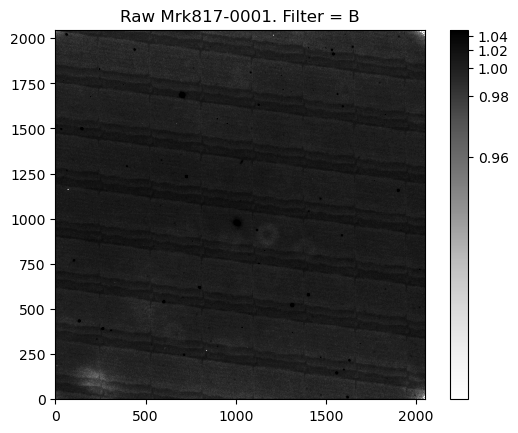

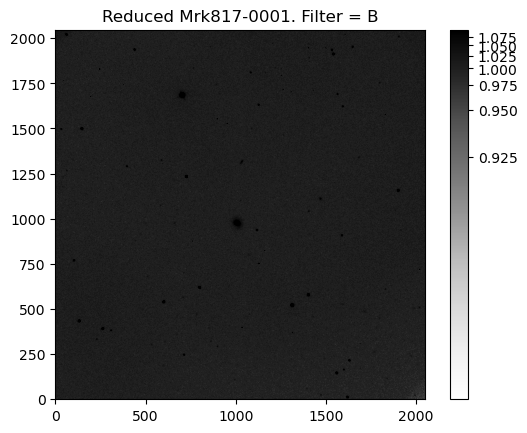

In [13]:
loaded_test=fits.open('Mrk817-0001_B.fit')[0].data
loaded_test_med = np.median(loaded_test, axis=0)
loaded_test_view = loaded_test/loaded_test_med

filter_visualization (loaded_test_view, 'Raw Mrk817-0001', 'B')


reducted_test = reduction_fct('Mrk817-0001_B.fit', loaded_test, master_flat_B)

reducted_test = np.array(reducted_test)
red_test_median = np.median(reducted_test, axis=0)
master_red_test = reducted_test/red_test_median

filter_visualization (master_red_test, 'Reduced Mrk817-0001', 'B')

The difference in the unreduced image and the reduced image is apparent, mainly where the stars seemed to be inverted in values, and signifies that the reduction works to some degree. Although a significant amount of artifact can be seen, it is clear that only 1 star point is visible. The misalignment can further be verified by checking the right ascension and declination of object in the same filter.

In [14]:
for file in glob.glob(Mrk817_names_filter[0]):
    hdul = fits.open(file)
    hdr = hdul[0].header
    print('ra = {}, dec = {}'.format(hdr['OBJCTRA'], hdr['OBJCTDEC'])) # problem: image not aligning

ra = 14 36 20, dec = +58 47 42
ra = 14 36 20, dec = +58 47 33
ra = 14 36 21, dec = +58 47 32


Checking the header of one of the .fit file, it is unclear that the WCS information, that can be used for alignment, is present

In [15]:
hdr

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-22T17:58:57' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   180.00000000000000 /Exposure time in seconds                        
EXPOSURE=   180.00000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

There's a python package called astroalign that claims to perform stellar alignment called astroalign. The main function of the package, astroalign.register(input, target), aligns the input image with the target image and produces a new aligned image with the transformation matrix. astroalign package works by using geometry to find the common star positions.

But first, we need to redefine the master reduction function

In [16]:
#reduction function defining (differs for each frames (?))
#astroalign test

#this function is different from the master_reduction, since master_reduction function sums the 3 images


def master_reduction_nostack (filename, flat): #this is the same function as master_reduction function, just remove the stacking
    dummy = []
    for file in glob.glob(filename):
        
        loaded=fits.open(file)[0].data
        reducted = reduction_fct(file, loaded, flat)
        
        reducted = np.array(reducted)
        
        
#         question for next steps: is these two lines even needed? or only for visualization purposes?
        red_median = np.median(reducted, axis=0)
        reducted = reducted/ red_median
#         ##########################################################
        
        dummy.append(reducted)
    
    dummy = np.array(dummy)

    return dummy
#this time, the return value is a list of n 2D array, with n = # of files listed in the filename

Visualization of the master flats shows that images of R filters has a different artifact compared to other filters. Therefore, astroalign will be tested with B filter and R filter.

In [17]:
#test it with Mrk 817
Mrk817_R_unstacked = master_reduction_nostack(Mrk817_names_filter[3], master_flat_R)
Mrk817_B_unstacked = master_reduction_nostack(Mrk817_names_filter[0], master_flat_B)

In [18]:
# testing astroalign for Mrk817
import astroalign as aa
alignment1_B, _ = aa.register(Mrk817_B_unstacked[1], Mrk817_B_unstacked[0])
alignment1_R, _ = aa.register(Mrk817_R_unstacked[1], Mrk817_R_unstacked[0])

Astroalign package does not work in R filter, although it works on B filter, with error says less than minimum values for reference stars. This is probably because astroalign accepts the B filter artifacts as the alignment stars. A way to rectify this is to accurately grab the WCS value in order to get a more accurate alignments. One of the possible correction tools is astrometry.net, although further testing needs to be done.

the same goes for Mrk335 as evidenced below

##### WITH UPDATED FILES
with the updated files, astroalign works. However, the process done below still assumes the astroalign does not work.

In [19]:
# testing astroalign for Mrk335
import astroalign as aa
Mrk335_R_unstacked = master_reduction_nostack(Mrk335_names_filter[3], master_flat_R)
Mrk335_B_unstacked = master_reduction_nostack(Mrk335_names_filter[0], master_flat_B)

alignment1_B, _ = aa.register(Mrk335_B_unstacked[1], Mrk335_B_unstacked[0])
alignment1_R, _ = aa.register(Mrk335_R_unstacked[1], Mrk335_R_unstacked[0])

Curiously, it works for Mrk6.

In [20]:
# testing astroalign for Mrk6
import astroalign as aa
Mrk6_R_unstacked = master_reduction_nostack(Mrk6_names_filter[3], master_flat_R)
Mrk6_B_unstacked = master_reduction_nostack(Mrk6_names_filter[0], master_flat_B)

alignment1_B, _ = aa.register(Mrk6_B_unstacked[1], Mrk6_B_unstacked[0])
alignment1_R, _ = aa.register(Mrk6_R_unstacked[1], Mrk6_R_unstacked[0])

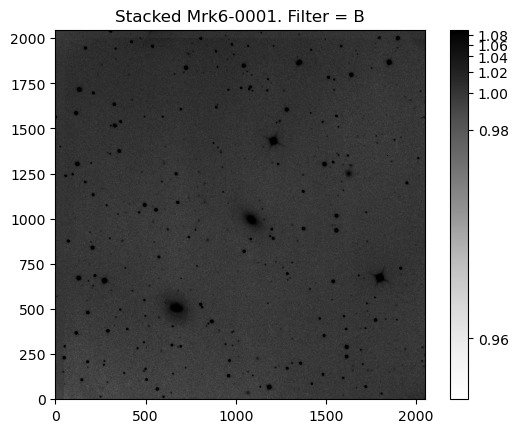

In [21]:
alignment1_R = np.array(alignment1_R)
Mrk6_R_stacked = np.sum((Mrk6_R_unstacked[0], alignment1_R), axis=0)
stacked_median = np.median(Mrk6_R_stacked, axis=0)
Mrk6_R_stacked = Mrk6_R_stacked/stacked_median

filter_visualization(Mrk6_R_stacked, 'Stacked Mrk6-0001', 'B')

Unfortunately, it was a false positive as the stars were doubled. It seems that, even for the R filter, the artifact from the observation was too much to be sufficiently calibrated. Further investigations down the line show that this might be due to some bug in the master_reduction_nostack function.

#### Bypassing the need of alignment

An idea is to grab the mean value of the photometry calculation for all of the three image without aligning and summing them.

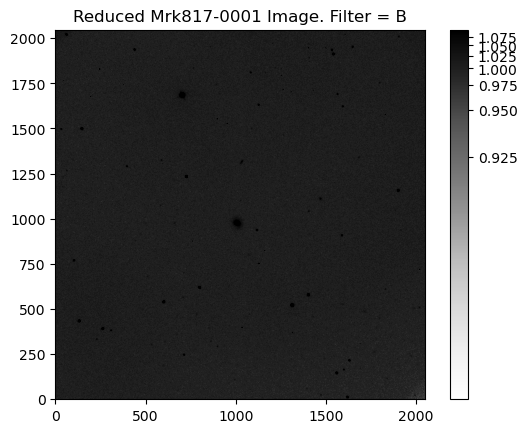

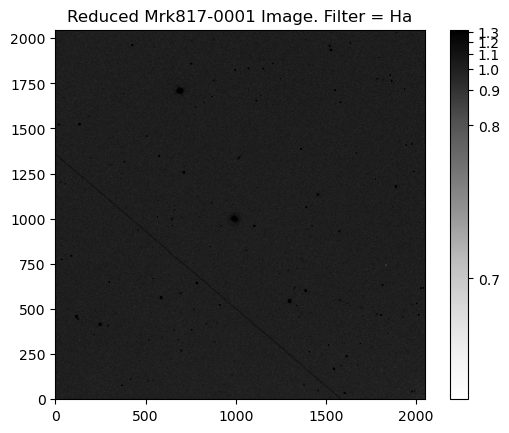

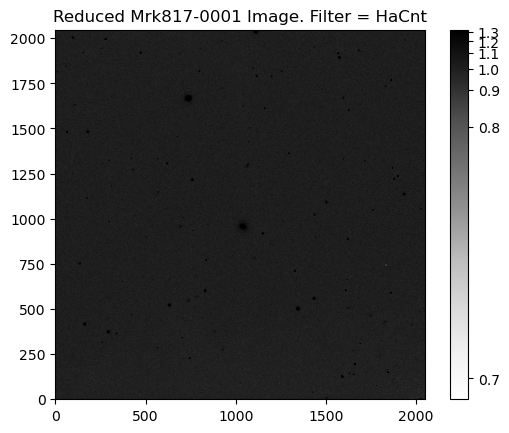

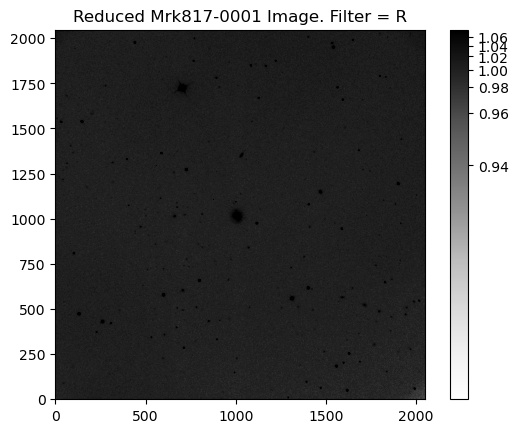

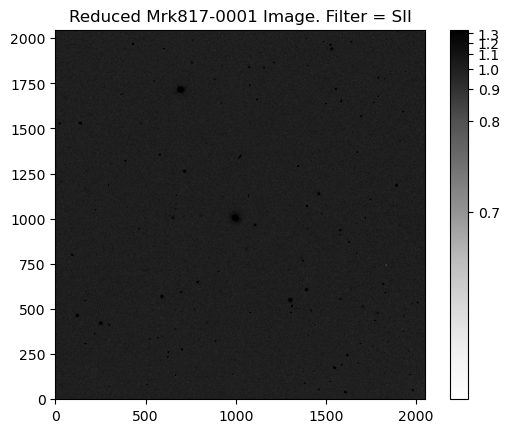

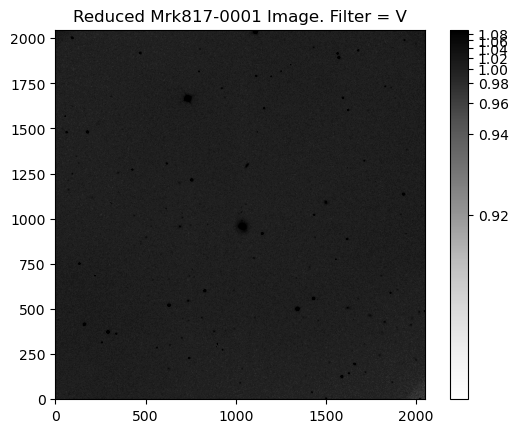

In [22]:
#reduce all science frames with new unstacked function
# for Mrk817

#test and visualize one in each filters
Mrk817_B_unstacked = master_reduction_nostack(Mrk817_names_filter[0], master_flat_B)
Mrk817_Ha_unstacked = master_reduction_nostack(Mrk817_names_filter[1], master_flat_Ha)
Mrk817_HaCnt_unstacked = master_reduction_nostack(Mrk817_names_filter[2], master_flat_HaCnt)
Mrk817_R_unstacked = master_reduction_nostack(Mrk817_names_filter[3], master_flat_R)
Mrk817_SII_unstacked = master_reduction_nostack(Mrk817_names_filter[4], master_flat_SII)
Mrk817_V_unstacked = master_reduction_nostack(Mrk817_names_filter[5], master_flat_V)

filter_visualization (Mrk817_B_unstacked[0], 'Reduced Mrk817-0001 Image', 'B')
filter_visualization (Mrk817_Ha_unstacked[0], 'Reduced Mrk817-0001 Image', 'Ha')
filter_visualization (Mrk817_HaCnt_unstacked[0], 'Reduced Mrk817-0001 Image', 'HaCnt')
filter_visualization (Mrk817_R_unstacked[0], 'Reduced Mrk817-0001 Image', 'R')
filter_visualization (Mrk817_SII_unstacked[0], 'Reduced Mrk817-0001 Image', 'SII')
filter_visualization (Mrk817_V_unstacked[0], 'Reduced Mrk817-0001 Image', 'V')


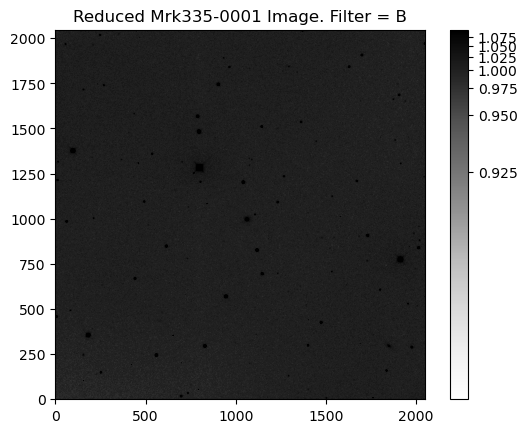

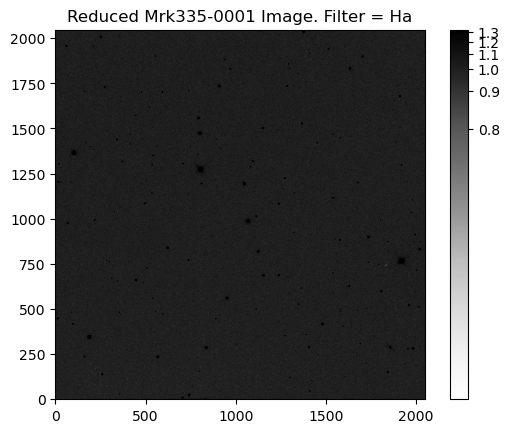

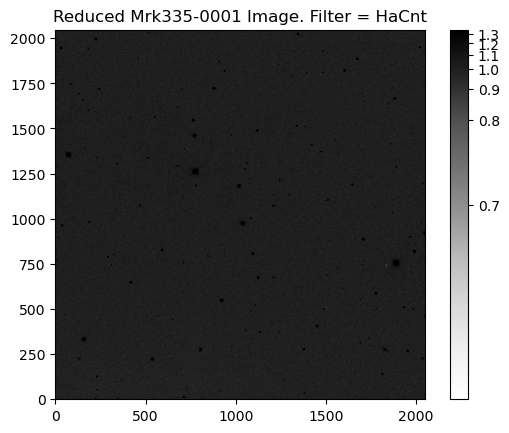

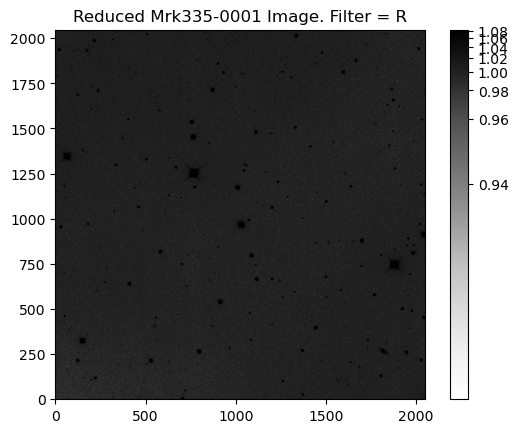

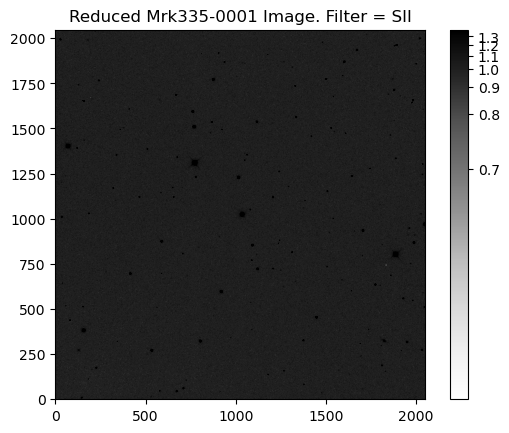

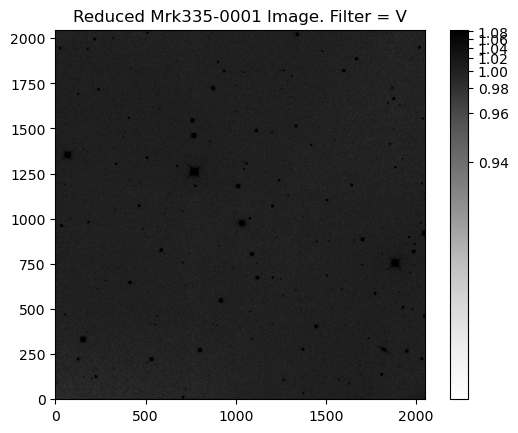

In [23]:
# for Mrk335

#test and visualize one in each filters
Mrk335_B_unstacked = master_reduction_nostack(Mrk335_names_filter[0], master_flat_B)
Mrk335_Ha_unstacked = master_reduction_nostack(Mrk335_names_filter[1], master_flat_Ha)
Mrk335_HaCnt_unstacked = master_reduction_nostack(Mrk335_names_filter[2], master_flat_HaCnt)
Mrk335_R_unstacked = master_reduction_nostack(Mrk335_names_filter[3], master_flat_R)
Mrk335_SII_unstacked = master_reduction_nostack(Mrk335_names_filter[4], master_flat_SII)
Mrk335_V_unstacked = master_reduction_nostack(Mrk335_names_filter[5], master_flat_V)

filter_visualization (Mrk335_B_unstacked[0], 'Reduced Mrk335-0001 Image', 'B')
filter_visualization (Mrk335_Ha_unstacked[0], 'Reduced Mrk335-0001 Image', 'Ha')
filter_visualization (Mrk335_HaCnt_unstacked[0], 'Reduced Mrk335-0001 Image', 'HaCnt')
filter_visualization (Mrk335_R_unstacked[0], 'Reduced Mrk335-0001 Image', 'R')
filter_visualization (Mrk335_SII_unstacked[0], 'Reduced Mrk335-0001 Image', 'SII')
filter_visualization (Mrk335_V_unstacked[0], 'Reduced Mrk335-0001 Image', 'V')

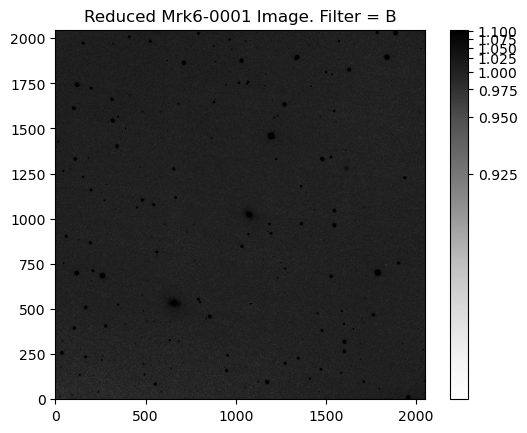

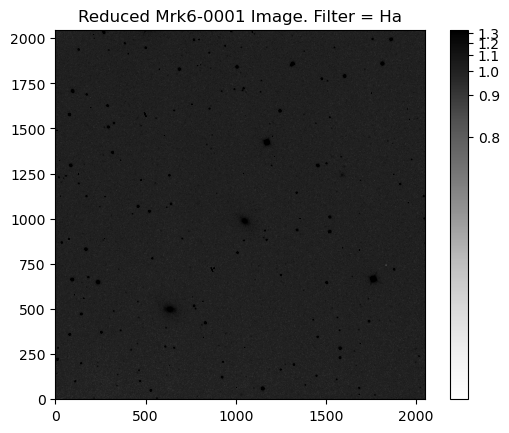

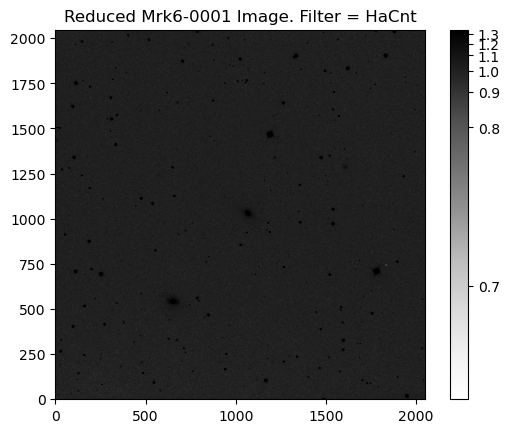

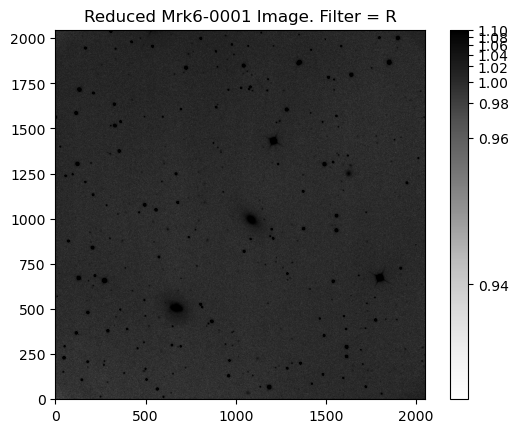

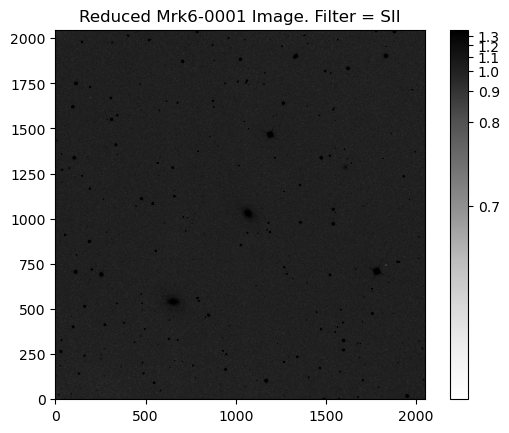

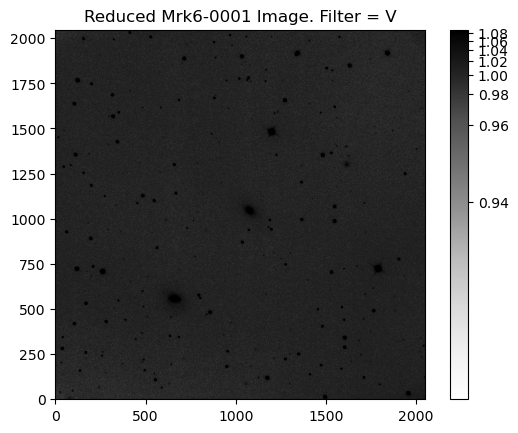

In [24]:
#Mrk 6
Mrk6_B_unstacked = master_reduction_nostack(Mrk6_names_filter[0], master_flat_B)
Mrk6_Ha_unstacked = master_reduction_nostack(Mrk6_names_filter[1], master_flat_Ha)
Mrk6_HaCnt_unstacked = master_reduction_nostack(Mrk6_names_filter[2], master_flat_HaCnt)
Mrk6_R_unstacked = master_reduction_nostack(Mrk6_names_filter[3], master_flat_R)
Mrk6_SII_unstacked = master_reduction_nostack(Mrk6_names_filter[4], master_flat_SII)
Mrk6_V_unstacked = master_reduction_nostack(Mrk6_names_filter[5], master_flat_V)

filter_visualization (Mrk6_B_unstacked[0], 'Reduced Mrk6-0001 Image', 'B')
filter_visualization (Mrk6_Ha_unstacked[0], 'Reduced Mrk6-0001 Image', 'Ha')
filter_visualization (Mrk6_HaCnt_unstacked[0], 'Reduced Mrk6-0001 Image', 'HaCnt')
filter_visualization (Mrk6_R_unstacked[0], 'Reduced Mrk6-0001 Image', 'R')
filter_visualization (Mrk6_SII_unstacked[0], 'Reduced Mrk6-0001 Image', 'SII')
filter_visualization (Mrk6_V_unstacked[0], 'Reduced Mrk6-0001 Image', 'V')

## Performing Aperture Photometry

The aperture photometry done are instrumental magnitudes and absolute magnitude. In order to obtain the absolute magnitude, several of prior studies are given as reference. The references give the magnitudes of comparison stars within the field of view of the object as well as the finding chart for the object and the comparison stars. 

### Reorientation of images
Since this project uses the comparison stars from the references, the reduced images will be reoriented in order to fit the view of the finding charts given. For all of the three objects, the R filter seems to have the least amount of artifacts after the reduction. Therefore, the reorientation effort will use the R filter images extensively.

#### Mrk 817 Reorientation
For Mrk 817, the reference used is from Webb and Malkan (2000). Below are is the finding chart of the Mrk817 with the reference chart marked, and the image below it is the observed and reduced image of Mrk817 in R filter 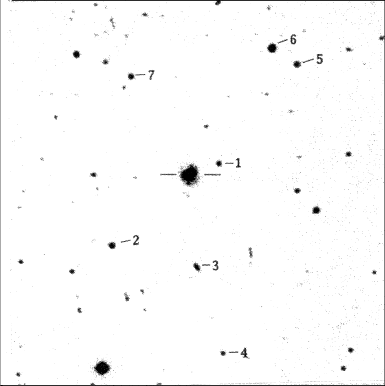

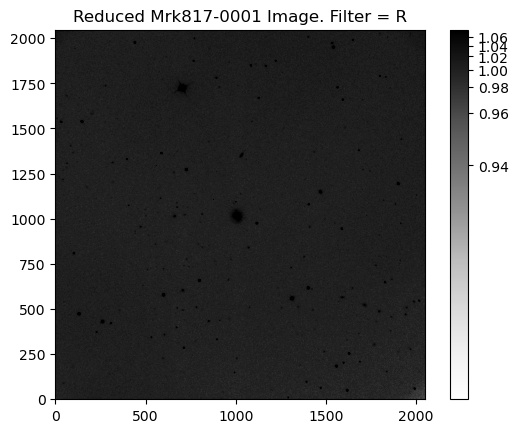

In [25]:
filter_visualization (Mrk817_R_unstacked[0], 'Reduced Mrk817-0001 Image', 'R')

Comparing both images, it is clear that the image is flipped, especially the orientation of reference star number 1, 5, and 6. The reference finding chart also have a smaller field of view compared to the observation image. Since it is assumed all images in all filter of the same star will have similar orientation, the reorientation are done as below.

In [26]:
# Performing the flip for Mrk817, with all filters have 3 images all
def Mrk817_flip (namelist):
    image_correct = []
    
    for i in range(3):
        dummy = np.flip(namelist[i], axis=0)
        image_correct.append(dummy)
    
    return np.array(image_correct)


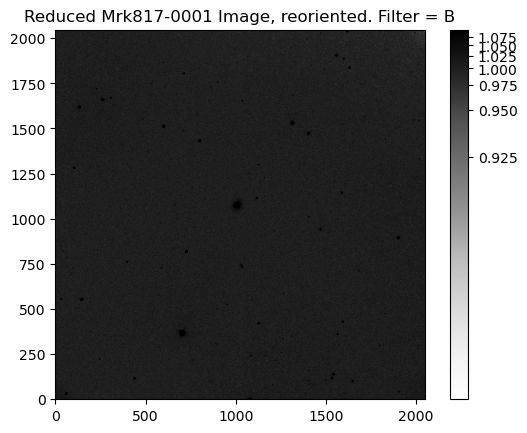

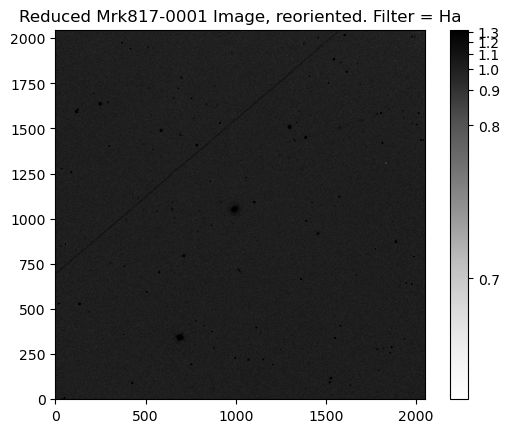

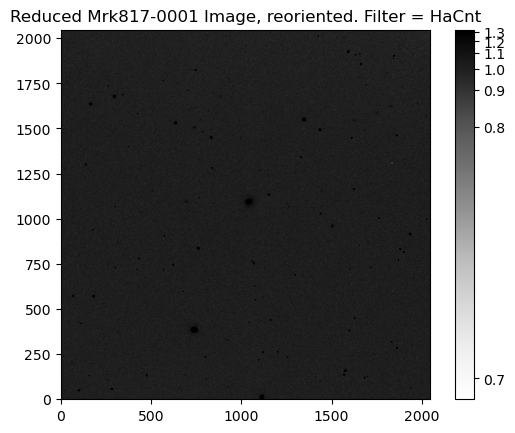

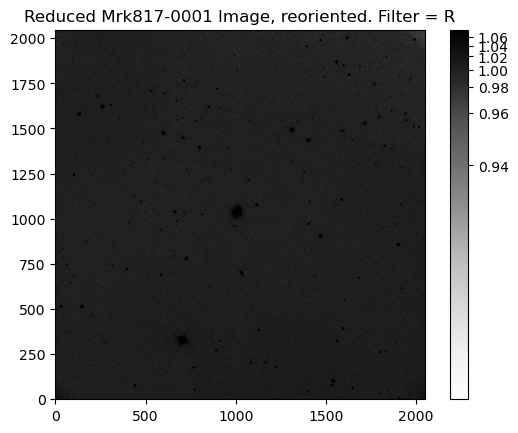

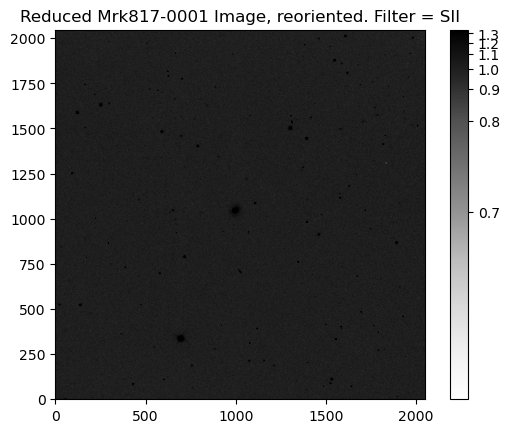

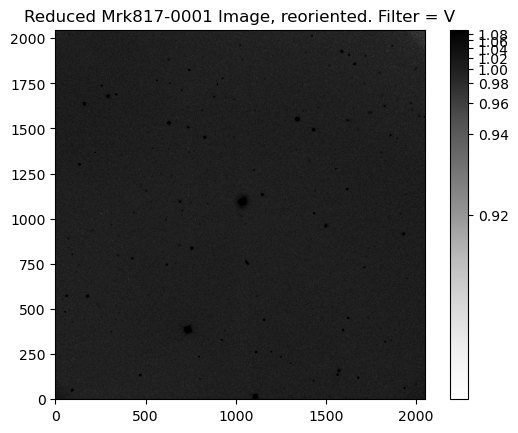

In [27]:
Mrk817_B_unstacked_reorient = Mrk817_flip(Mrk817_B_unstacked)
Mrk817_Ha_unstacked_reorient = Mrk817_flip(Mrk817_Ha_unstacked)
Mrk817_HaCnt_unstacked_reorient = Mrk817_flip(Mrk817_HaCnt_unstacked)
Mrk817_R_unstacked_reorient = Mrk817_flip(Mrk817_R_unstacked)
Mrk817_SII_unstacked_reorient = Mrk817_flip(Mrk817_SII_unstacked)
Mrk817_V_unstacked_reorient = Mrk817_flip(Mrk817_V_unstacked)

filter_visualization(Mrk817_B_unstacked_reorient[0], "Reduced Mrk817-0001 Image, reoriented", "B")
filter_visualization(Mrk817_Ha_unstacked_reorient[0], "Reduced Mrk817-0001 Image, reoriented", "Ha")
filter_visualization(Mrk817_HaCnt_unstacked_reorient[0], "Reduced Mrk817-0001 Image, reoriented", "HaCnt")
filter_visualization(Mrk817_R_unstacked_reorient[0], "Reduced Mrk817-0001 Image, reoriented", "R")
filter_visualization(Mrk817_SII_unstacked_reorient[0], "Reduced Mrk817-0001 Image, reoriented", "SII")
filter_visualization(Mrk817_V_unstacked_reorient[0], "Reduced Mrk817-0001 Image, reoriented", "V")

#### Mrk 335 Reorientation
There are two references for Mrk 335 with different numbers of reference stars. Mihov & Slavcheva-Mihova (2008) gives 4 reference stars while Doroshenko, et al (2005) gives 7. Below are is the finding chart of the Mrk335 with reference stars marked from Doroshenko (top) and Mihov & Slavcheva-Mihova (bottom).

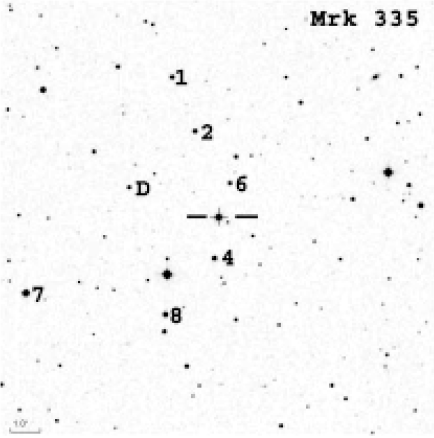

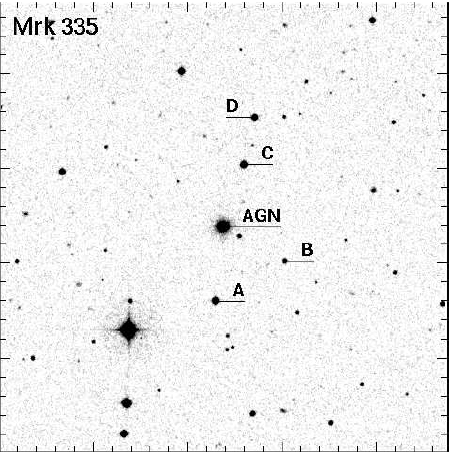

Both finding charts seem to be using the same orientation, with Doroshenko one having more field of view. This is indicated by the similary with the 4-star line at the bottom-left at Mihov & Slavcheva-Mihova's chart is similar to the 4-star line with reference star number 8 in Doroshenko's chart. In addition, Mihov & Slavcheva-Mihova's chart two of the same reference star (labelled A and C) as Doroshenko's chart (labelled 4 and 6).

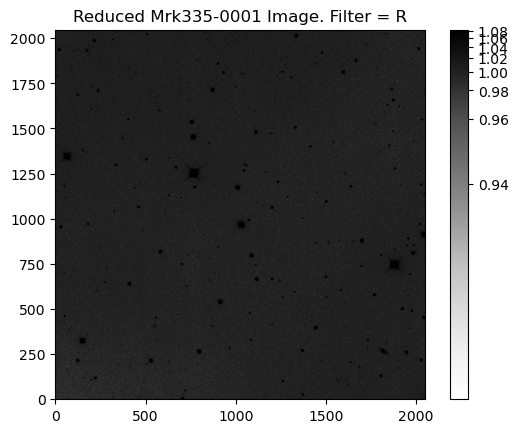

In [28]:
#comparison to the observation image of Mrk 335 in the R filter as shown below
filter_visualization (Mrk335_R_unstacked[0], 'Reduced Mrk335-0001 Image', 'R')

The image seemed to be flipped similarly as the Mrk 817. Therefore, the same reorientation function for Mrk 817 can be used for Mrk 335 

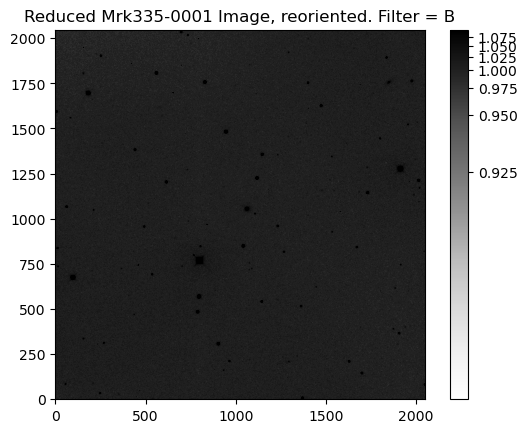

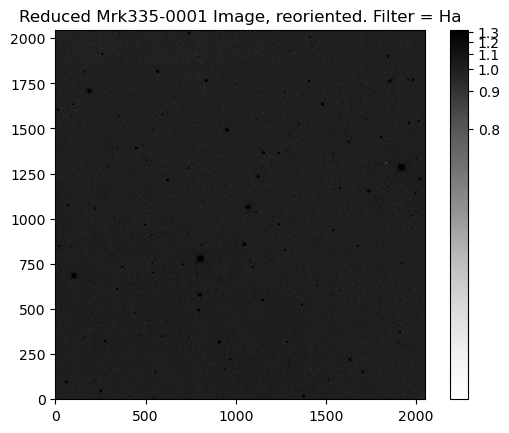

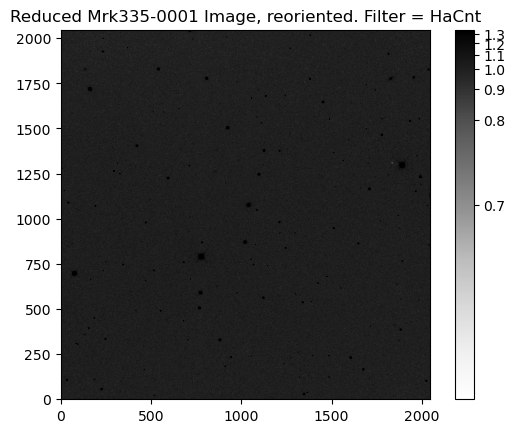

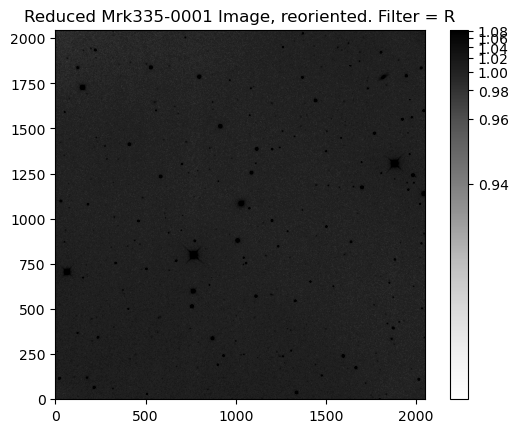

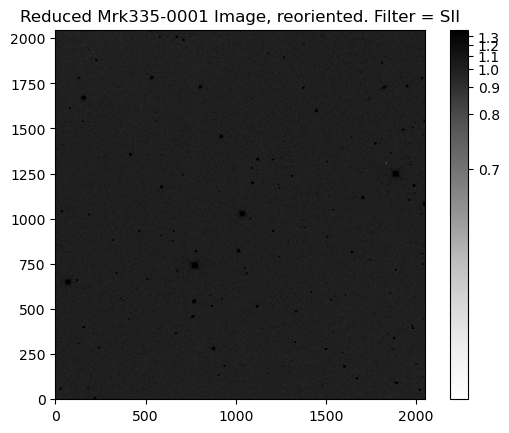

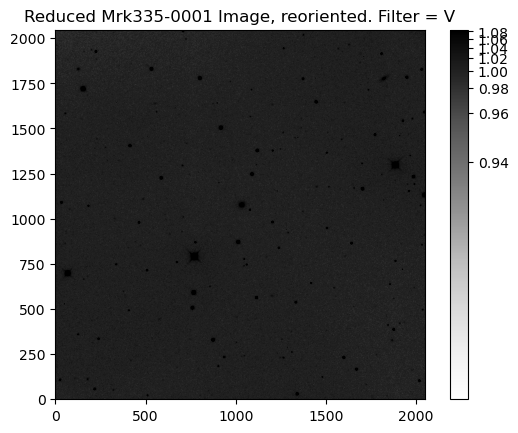

In [29]:
Mrk335_B_unstacked_reorient = Mrk817_flip(Mrk335_B_unstacked)
Mrk335_Ha_unstacked_reorient = Mrk817_flip(Mrk335_Ha_unstacked)
Mrk335_HaCnt_unstacked_reorient = Mrk817_flip(Mrk335_HaCnt_unstacked)
Mrk335_R_unstacked_reorient = Mrk817_flip(Mrk335_R_unstacked)
Mrk335_SII_unstacked_reorient = Mrk817_flip(Mrk335_SII_unstacked)
Mrk335_V_unstacked_reorient = Mrk817_flip(Mrk335_V_unstacked)

filter_visualization(Mrk335_B_unstacked_reorient[0], "Reduced Mrk335-0001 Image, reoriented", "B")
filter_visualization(Mrk335_Ha_unstacked_reorient[0], "Reduced Mrk335-0001 Image, reoriented", "Ha")
filter_visualization(Mrk335_HaCnt_unstacked_reorient[0], "Reduced Mrk335-0001 Image, reoriented", "HaCnt")
filter_visualization(Mrk335_R_unstacked_reorient[0], "Reduced Mrk335-0001 Image, reoriented", "R")
filter_visualization(Mrk335_SII_unstacked_reorient[0], "Reduced Mrk335-0001 Image, reoriented", "SII")
filter_visualization(Mrk335_V_unstacked_reorient[0], "Reduced Mrk335-0001 Image, reoriented", "V")

#### Mrk6 Reorientation
Across the given literature used (Doroshenko, et al. (2005a, 2005b, 2007), Mihov & Slavcheva-Mihova (2008), Villata (1998), and Webb & Malkan (2000)), there are no prior research for Mrk6. There is a mention of Mrk6 in Doroshenko, et al. (2007), but it was used as a reference star as the other object. It is not sure whether this can be used, as stars positions are incorrect for the finding chart given, even accounting for the object. Therefore, absolute aperture photometry cannot be performed here.

### Instrumental Magnitude
#### Aperture determination
Before performing the aperture photometry, the aperture position and size has to be defined. This is a problem since the object of interest is not exactly in the center, especially with the misalignment present. Hence, the aperture position is located manually with following codes from the photutils tutorial as follows:

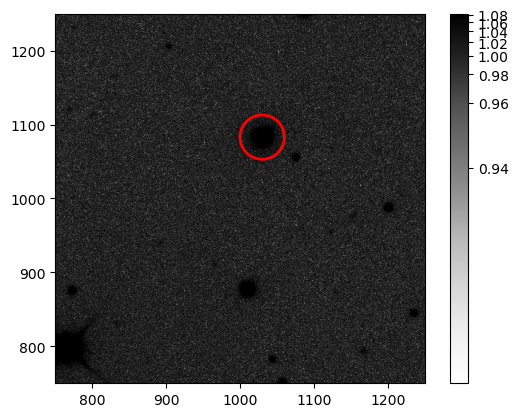

In [30]:
# %matplotlib notebook          
#this is only for grabbing the position by pointing. 
#comment the top line and restart the notebook kernel to reset the matplotlib

import matplotlib.pyplot as plt
from astropy.visualization import simple_norm
from photutils.aperture import CircularAnnulus, CircularAperture

#idea: to better grab the position, there's a way to register mouse position click as coordinate.
#so far, mouse hovers can be read


#for ease of reading, add the crosshair located at midpoint of image at (1024, 1024)
fig, ax = plt.subplots()
ax.plot()
# ax.axhline(y=1024, color='w')
# ax.axvline(x=1024, color = 'w')


data = Mrk335_R_unstacked_reorient[0]
positions = [(1030, 1083)]
aperture = CircularAperture(positions, r=30) #use r=5 to make small at first bigger to confirm
# annulus_aperture = CircularAnnulus(positions, r_in=10, r_out=15)

norm = simple_norm(data, 'log', percent=99)
plt.imshow(data, norm=norm, origin='lower', cmap='Greys')
plt.xlim(750, 1250)
plt.ylim(750, 1250)
plt.colorbar()

ap_patches = aperture.plot(color='red', lw=2,
                           label='Photometry aperture')

plt.show()

In [31]:
#list the aperture position here
#Mrk817
aperture_pos_817_B = [(1008, 1070), (1017, 1103), (1030, 1115)]
aperture_pos_817_Ha = [(992, 1048), (1053, 1097), (1043, 1070)]
aperture_pos_817_HaCnt = [(1040, 1092), (990, 1048), (1003, 1116)]
aperture_pos_817_R = [(1010, 1035), (1050, 1100), (1043, 1059)]
aperture_pos_817_SII = [(997, 1043), (1004, 1102), (1018, 1071)]
aperture_pos_817_V = [(1037, 1090), (1051, 1050), (1038, 1111)]

#Mrk335
aperture_pos_335_B = [(1062, 1053), (1045, 1055), (1057, 1066)]
aperture_pos_335_Ha = [(1067, 1062), (1030, 1019), (1058, 1006)]
aperture_pos_335_HaCnt = [(1038, 1074), (1035, 1024), (1013, 1011)]
aperture_pos_335_R = [(1030, 1083), (1094, 1045), (1048, 1022)]
aperture_pos_335_SII = [(1036, 1025), (1062, 1051), (1048, 1032)]
aperture_pos_335_V = [(1033, 1075), (1092, 1085), (1075, 1060)]

#Mrk6
aperture_pos_6_B = [(1074, 1020), (1043, 986)]
aperture_pos_6_Ha = [(1050, 985), (1039, 1032)]
aperture_pos_6_HaCnt = [(1067, 1029), (1045, 1003)]
aperture_pos_6_R = [(1089, 990), (1037, 1039)]
aperture_pos_6_SII = [(1069, 1027), (1030, 1026)]
aperture_pos_6_V = [(1076, 1045), (1100, 1040)]

The aperture radius will be variated from 5 to 75. The limits are determined somewhat arbitrarily as the range encompasses the objects quite well in all filters. The upper limit contains some background, however.

In [32]:
radius_range = np.arange(start=1, stop=100, step=0.01)

#### Local Background Substraction

The data is assumed to still contain some amount of background data. The main function of photutils.aperture.aperture_photometry and photutils.apertre.ApertureStats assumes the image has been background-substacted. Fortunately, background substraction can be done locally using with photutils by using annulus aperture for the background.

Since the object arperture is variative, it might be better if the annulus for background is also variative. Arbitrarily, it is determined that the inner radius of annulus is picked as 1.2 times of aperture radius, while the outer radius is 1.4 times the aperture radius

Without further background substraction, the following obtains the aperture of one of the images of Mrk 817 at R filter:

In [33]:
image = Mrk817_R_unstacked_reorient [0]
aperture = CircularAperture(aperture_pos_817_R[0], r=5.0)

photometry_res = aperture_photometry(image, aperture)
photometry_res

id,xcenter,ycenter,aperture_sum
,pix,pix,
int32,float64,float64,float64
1,1010.0,1035.0,377.25162283664906


using the same radius and image, the effect of the background is quantified

In [34]:
image = Mrk817_R_unstacked_reorient [0]
aperture = CircularAperture(aperture_pos_817_R[0], r=5.5)
bg_apert = CircularAnnulus(aperture_pos_817_R[0], r_in=30, r_out=35)

#checking the mean of the circular annulus
bg_apert_stats = ApertureStats(image, bg_apert)
bg_mean = bg_apert_stats.mean
print('Mean background level = {}'.format(bg_mean))

# we didn't use mask, so aperture.area_overlap(image) is the same as aperture.area
print('Aperture area = {}'.format(aperture.area)) 
ap_area = aperture.area

#background value
total_bg = bg_mean*ap_area
print('background substraction = {}'.format(total_bg))

Mean background level = 1.0356787981151623
Aperture area = 95.03317777109125
background substraction = 98.42384733502834


The final result is the aperture_sum value subtracted with the background subtraction value

In [35]:
final_res = photometry_res['aperture_sum'] - total_bg
final_res

278.82777550162075


#### Inverted values and revisiting the alignment issue

The final result is a negative value. This is somewhat expected because, as shown in the visualization, the image color and the table values are reversed and thus, lower values means brighter object. However, this can be an issue when trying to obtain the object magnitude. The apparent magnitude of an object compared to another object is given with the following equation:

$$
  m_1-m_2=-2.5 log\left ( \frac{F_1}{F_2} \right )
$$

where $\frac{F_1}{F_2}$ shows the flux ratio. Relating to the aperture photometry count, the flux $F=\frac{(gain)(count)}{t_{exp}}$. Since the reference star is taken with the one from the image, the gain and exposure time terms cancels out. Therefore, with an inverted count from the aperture photomery, the apparent magnitude can be modified to obtain the following equation:

$$
  m_{AGN}=m_{reference} + 2.5 log\left ( \frac{count_1}{count_2} \right )
$$

Previously, we still have an issue with the alignment using astroalign tool. Without stacking, each of the reference stars pixel position has to be taken multiple times, while positioning only has to be taken once if the image is stacked. If solving the inverted value can solve the alignment and stacking issue while not changing count value, we can use the original equation for obtaining the apparent magnitude

In [36]:
#defining a proper master reduction function, ignoring the visualization
def master_reduction_final (filename, flat): #this is the same function as master_reduction function, just remove the stacking
    dummy = []
    for file in glob.glob(filename):
        
        loaded=fits.open(file)[0].data
        reducted = reduction_fct(file, loaded, flat)
        
        reducted = np.array(reducted)
        
#         question from the previous master reduction function: is these two lines even needed? or only for visualization purposes?
#         answer: yes. this is only for visualization. commenting both lines seems to solve the issue
#         red_median = np.median(reducted, axis=0)
#         reducted = reducted/ red_median
        
        dummy.append(reducted)
    
    dummy = np.array(dummy)

    return dummy

Now that the issue has been solved, image reduction is done once again

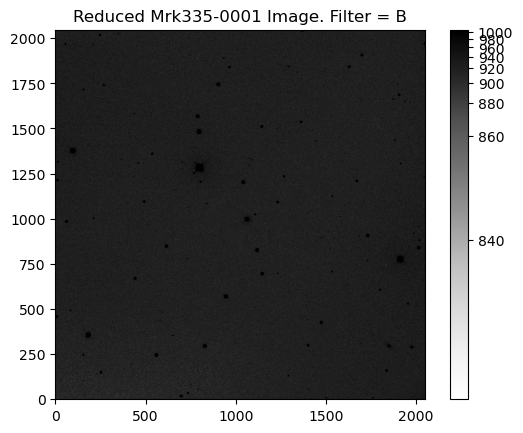

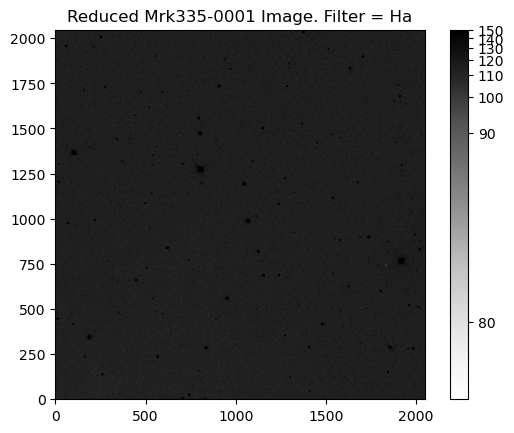

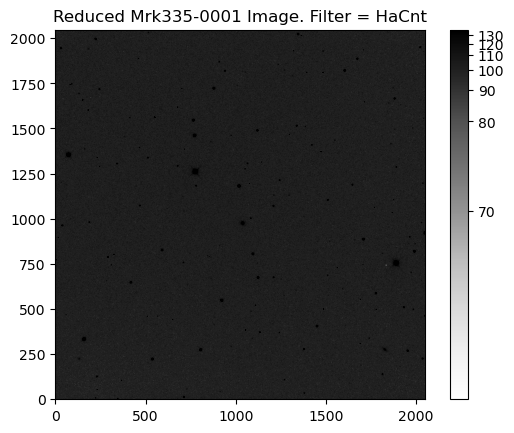

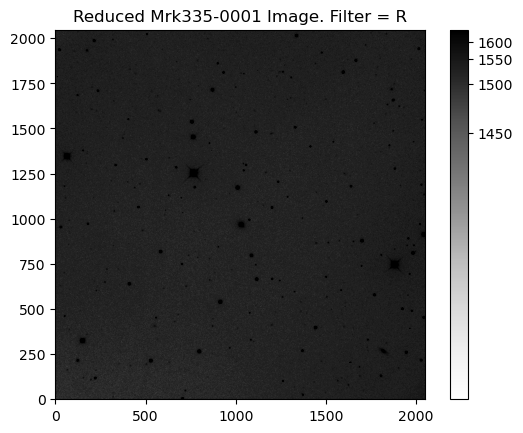

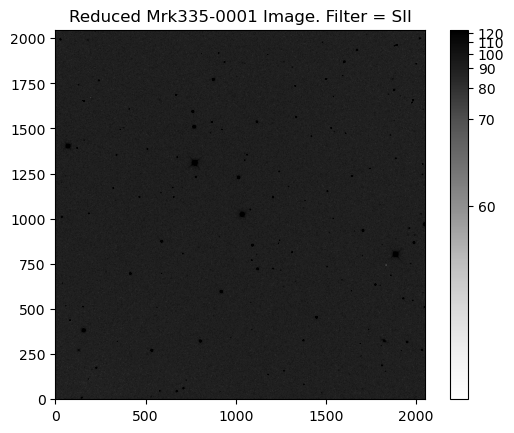

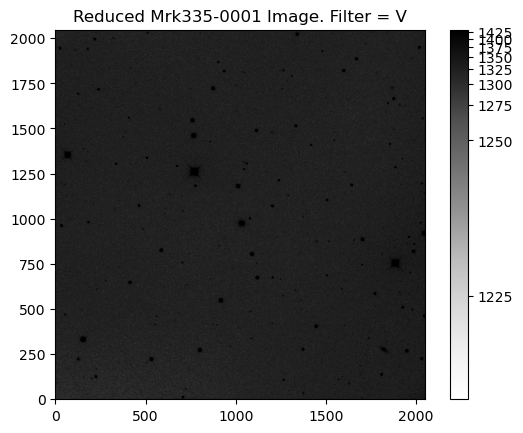

In [37]:
Mrk335_B_unstacked_final = master_reduction_final(Mrk335_names_filter[0], master_flat_B)
Mrk335_Ha_unstacked_final = master_reduction_final(Mrk335_names_filter[1], master_flat_Ha)
Mrk335_HaCnt_unstacked_final = master_reduction_final(Mrk335_names_filter[2], master_flat_HaCnt)
Mrk335_R_unstacked_final = master_reduction_final(Mrk335_names_filter[3], master_flat_R)
Mrk335_SII_unstacked_final = master_reduction_final(Mrk335_names_filter[4], master_flat_SII)
Mrk335_V_unstacked_final = master_reduction_final(Mrk335_names_filter[5], master_flat_V)

filter_visualization (Mrk335_B_unstacked_final[0], 'Reduced Mrk335-0001 Image', 'B')
filter_visualization (Mrk335_Ha_unstacked_final[0], 'Reduced Mrk335-0001 Image', 'Ha')
filter_visualization (Mrk335_HaCnt_unstacked_final[0], 'Reduced Mrk335-0001 Image', 'HaCnt')
filter_visualization (Mrk335_R_unstacked_final[0], 'Reduced Mrk335-0001 Image', 'R')
filter_visualization (Mrk335_SII_unstacked_final[0], 'Reduced Mrk335-0001 Image', 'SII')
filter_visualization (Mrk335_V_unstacked_final[0], 'Reduced Mrk335-0001 Image', 'V')

Compare it with the previous image reduction. Here the stars can't be seen in all filters, while the given values values in each pixel is a negative. This is theorized to be caused by the curiously large bias value. The bug in the master reduction functions allows visualization by normalizing the values, thus cancelling out the negative. In any case, this shows that visualization has to be separated from the actual data.

Since this is the same data, the same misorientation should persists. To ease further analysis, the image is reoriented first before doing the alignment. The next cell does the reorientation.

In [38]:
#reorientation
Mrk335_B_unstacked_final_reorient = Mrk817_flip(Mrk335_B_unstacked_final)
Mrk335_Ha_unstacked_final_reorient = Mrk817_flip(Mrk335_Ha_unstacked_final)
Mrk335_HaCnt_unstacked_final_reorient = Mrk817_flip(Mrk335_HaCnt_unstacked_final)
Mrk335_R_unstacked_final_reorient = Mrk817_flip(Mrk335_R_unstacked_final)
Mrk335_SII_unstacked_final_reorient = Mrk817_flip(Mrk335_SII_unstacked_final)
Mrk335_V_unstacked_final_reorient = Mrk817_flip(Mrk335_V_unstacked_final)

As mentioned on above cell, an idea to bypassing the alignment is to use average of the the obtained aperture photometry value in the three observations. The result will be presented as a graph of the obtained aperture photometry count against the aperture size.

In [39]:
def aperture_phot_values (image, aperture_position, image_num = 3):   #image number is 2 for Mrk6
    
    result = []
    
    for rad in (radius_range):
        per_radius = []
        
        for i in range(image_num):
            image_data = image[i]
            ap_position = aperture_position[i]
            
            aperture = CircularAperture(ap_position, r=rad)
            phot_res_table = aperture_photometry(image_data, aperture)
            phot_res = phot_res_table['aperture_sum']
            
            
            #bg substraction
            bg_apert = CircularAnnulus(ap_position, r_in = (1.2*rad), r_out = (1.4*rad)) 
            bg_apert_stats = ApertureStats(image[i], bg_apert)
            bg_mean = bg_apert_stats.mean
            
            ap_area = aperture.area
            total_bg = bg_mean*ap_area
            
            
            #subtract the value
            phot_res = phot_res - total_bg
            
            per_radius.append(phot_res)
        
        per_radius = np.array(per_radius)
        averaged = np.mean(per_radius)
        
        result.append(averaged)
    
    return np.array(result)

In [40]:
#obtaining the value for Mrk335
Mrk_335_B_values = aperture_phot_values(Mrk335_B_unstacked_final_reorient, aperture_pos_335_B)
Mrk_335_Ha_values = aperture_phot_values(Mrk335_Ha_unstacked_final_reorient, aperture_pos_335_Ha)
Mrk_335_HaCnt_values = aperture_phot_values(Mrk335_HaCnt_unstacked_final_reorient, aperture_pos_335_HaCnt)
Mrk_335_R_values = aperture_phot_values(Mrk335_R_unstacked_final_reorient, aperture_pos_335_R)
Mrk_335_SII_values = aperture_phot_values(Mrk335_SII_unstacked_final_reorient, aperture_pos_335_SII)
Mrk_335_V_values = aperture_phot_values(Mrk335_V_unstacked_final_reorient, aperture_pos_335_V)

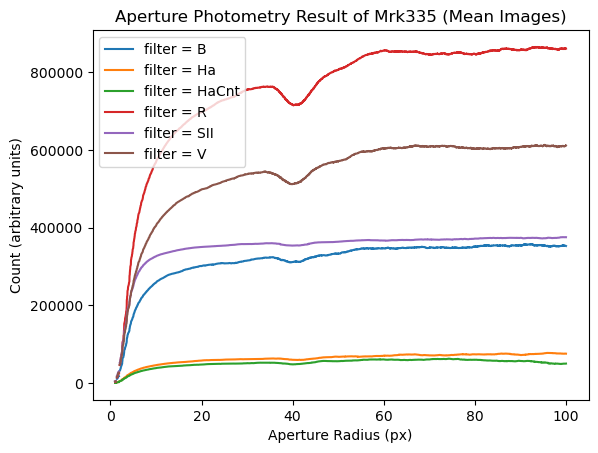

In [41]:
plt.plot(radius_range, Mrk_335_B_values, label="filter = B")
plt.plot(radius_range, Mrk_335_Ha_values, label="filter = Ha")
plt.plot(radius_range, Mrk_335_HaCnt_values, label="filter = HaCnt")
plt.plot(radius_range, Mrk_335_R_values, label="filter = R")
plt.plot(radius_range, Mrk_335_SII_values, label="filter = SII")
plt.plot(radius_range, Mrk_335_V_values, label="filter = V")
plt.legend()
plt.title('Aperture Photometry Result of Mrk335 (Mean Images)')
plt.xlabel('Aperture Radius (px)')
plt.ylabel('Count (arbitrary units)')
plt.show()

Now that the mean method has been obtained, the image stacking can be performed now. 

image_stacking function will be defined. The function aligns the image in the \_unstacked_final_reorient list with the image in the [0] index and stack them by taking the mean of each aligned pixel. This should be similar to taking the mean of aperture photometry in each image, but with added simplicity of using only one position for each aperture.

The function will generate two outputs: one image for data analysis, and one image as visualization.

In [42]:
import astroalign as aa

def image_stacking(image_arr, image_num = 3):
    alignment1, _ = aa.register(image_arr[1], image_arr[0])
    
    if image_num == 2:
        
        img_stc = np.mean((alignment1, image_arr[0]), axis=0)
        
        #visualization
        img_med = np.median(img_stc, axis=0)
        img_vis = img_stc/img_med
    
    
    elif image_num == 3:
        
        alignment2, _ = aa.register(image_arr[2], image_arr[0])
        img_stc = np.mean((alignment1, alignment2, image_arr[0]), axis=0)
        
        #visualization
        img_med = np.median(img_stc, axis=0)
        img_vis = img_stc/img_med

    return img_stc, img_vis


In [43]:
Mrk335_B_stack_data, Mrk335_B_stack_visual = image_stacking(Mrk335_B_unstacked_final_reorient)
Mrk335_Ha_stack_data, Mrk335_Ha_stack_visual = image_stacking(Mrk335_Ha_unstacked_final_reorient)
Mrk335_HaCnt_stack_data, Mrk335_HaCnt_stack_visual = image_stacking(Mrk335_HaCnt_unstacked_final_reorient)
Mrk335_R_stack_data, Mrk335_R_stack_visual = image_stacking(Mrk335_R_unstacked_final_reorient)
Mrk335_SII_stack_data, Mrk335_SII_stack_visual = image_stacking(Mrk335_SII_unstacked_final_reorient)
Mrk335_V_stack_data, Mrk335_V_stack_visual = image_stacking(Mrk335_V_unstacked_final_reorient)

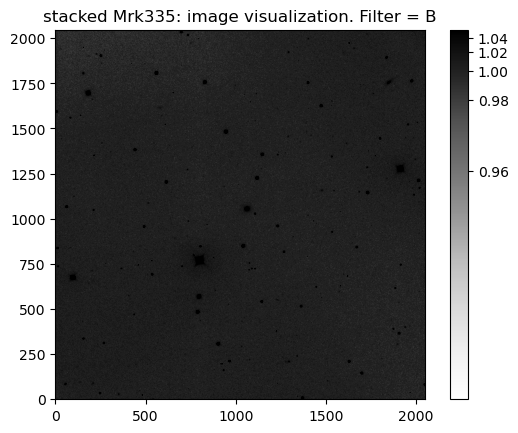

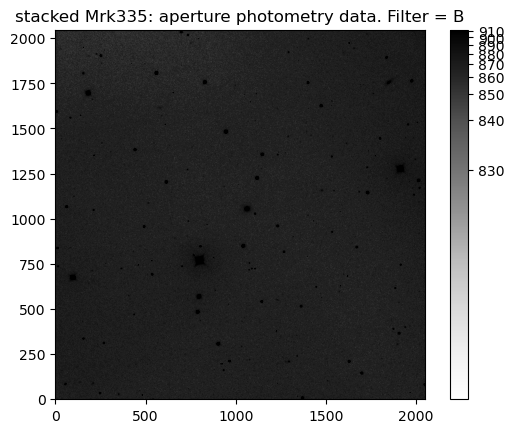

In [44]:
filter_visualization (Mrk335_B_stack_visual, 'stacked Mrk335: image visualization', 'B')
filter_visualization (Mrk335_B_stack_data, 'stacked Mrk335: aperture photometry data', 'B')

With the above visualization, it is evident that the image stacking is done properly. It is also to show how different the data for aperture photometry and the visualization can be. Visualization is still used as an output to obtain aperture position of reference stars.

A new aperture photometry function for the stacked images is defined. Since the alignment is based on the [0] indexed image, previously defined aperture for the [0] indexed image can be used.

In [45]:
def aperture_phot_values_stacked (image, aperture_position):
    
    result = []
    
    for rad in (radius_range):
        per_radius = []
        
        image_data = image
        ap_position = aperture_position[0]
            
        aperture = CircularAperture(ap_position, r=rad)
        phot_res_table = aperture_photometry(image_data, aperture)
        phot_res = phot_res_table['aperture_sum']
            
            
            #bg substraction
        bg_apert = CircularAnnulus(ap_position, r_in = (1.2*rad), r_out = (1.4*rad)) 
        bg_apert_stats = ApertureStats(image, bg_apert)
        bg_mean = bg_apert_stats.mean
            
        ap_area = aperture.area
        total_bg = bg_mean*ap_area
            
            
            #subtract the value
        phot_res = phot_res - total_bg
            
        result.append(phot_res)
    
    return np.array(result)

In [46]:
#obtaining the values for the stacked image
Mrk_335_stacked_B_values = aperture_phot_values_stacked(Mrk335_B_stack_data, aperture_pos_335_B)
Mrk_335_stacked_Ha_values = aperture_phot_values_stacked(Mrk335_Ha_stack_data, aperture_pos_335_Ha)
Mrk_335_stacked_HaCnt_values = aperture_phot_values_stacked(Mrk335_HaCnt_stack_data, aperture_pos_335_HaCnt)
Mrk_335_stacked_R_values = aperture_phot_values_stacked(Mrk335_R_stack_data, aperture_pos_335_R)
Mrk_335_stacked_SII_values = aperture_phot_values_stacked(Mrk335_SII_stack_data, aperture_pos_335_SII)
Mrk_335_stacked_V_values = aperture_phot_values_stacked(Mrk335_V_stack_data, aperture_pos_335_V)

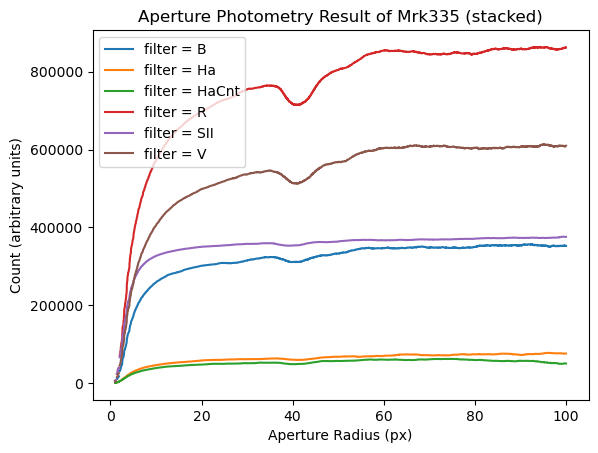

In [47]:
plt.plot(radius_range, Mrk_335_stacked_B_values, label="filter = B")
plt.plot(radius_range, Mrk_335_stacked_Ha_values, label="filter = Ha")
plt.plot(radius_range, Mrk_335_stacked_HaCnt_values, label="filter = HaCnt")
plt.plot(radius_range, Mrk_335_stacked_R_values, label="filter = R")
plt.plot(radius_range, Mrk_335_stacked_SII_values, label="filter = SII")
plt.plot(radius_range, Mrk_335_stacked_V_values, label="filter = V")
plt.legend()
plt.title('Aperture Photometry Result of Mrk335 (stacked)')
plt.xlabel('Aperture Radius (px)')
plt.ylabel('Count (arbitrary units)')
plt.show()

It is shown that the aperture photometry count graph from image stacking and image mean is very similar, as expected.

#### Radius Effect on Aperture Photometry Count

Similar process of aperture photometry is done for Mrk817 and Mrk6. To make it more robust, the above procedures are summarized as a function

In [48]:
def stacking_graph_and_visualization (image_filenames, flat_filter, aperture, image_num = 3, reorient = True):
    final_reduced = master_reduction_final(image_filenames, flat_filter)
    
    if reorient:
        final_reduced = Mrk817_flip(final_reduced)
    
    stack_data, stack_visual = image_stacking(final_reduced, image_num = image_num)
    graph_count = aperture_phot_values_stacked(stack_data, aperture)
    
    
    return graph_count, stack_visual


def mean_graph_and_visualization (image_filenames, flat_filter, aperture, image_num = 3, reorient = True):
    final_reduced = master_reduction_final(image_filenames, flat_filter)
    
    if reorient:
        final_reduced = Mrk817_flip(final_reduced)
    
    img_med = np.median(final_reduced, axis=0)
    img_vis = final_reduced/img_med
    
    graph_count = aperture_phot_values(final_reduced, aperture)
    
    
    return graph_count, img_vis

In [49]:
#for Mrk817
Mrk817_stack_B_values, Mrk817_B_stack_visual = stacking_graph_and_visualization(Mrk817_names_filter[0], master_flat_B, aperture_pos_817_B)
# Mrk817_stack_Ha_values, Mrk817_Ha_stack_visual = stacking_graph_and_visualization(Mrk817_names_filter[1], master_flat_Ha, aperture_pos_817_Ha)
# Mrk817_stack_HaCnt_values, Mrk817_HaCnt_stack_visual = stacking_graph_and_visualization(Mrk817_names_filter[2], master_flat_HaCnt, aperture_pos_817_HaCnt)
Mrk817_stack_R_values, Mrk817_R_stack_visual = stacking_graph_and_visualization(Mrk817_names_filter[3], master_flat_R, aperture_pos_817_R)
# Mrk817_stack_SII_values, Mrk817_SII_stack_visual = stacking_graph_and_visualization(Mrk817_names_filter[4], master_flat_SII, aperture_pos_817_SII)
Mrk817_stack_V_values, Mrk817_V_stack_visual = stacking_graph_and_visualization(Mrk817_names_filter[5], master_flat_V, aperture_pos_817_V)

Unfortunately, for Mrk817 in Ha, Ha continuum, and SII filter, the alignment fails. This is perhaps due to the observation in the filter is too faint compared to the artifacts. In this case, the three filters will be done with mean value since as previously demonstrated, the values are the same.

In [50]:
Mrk817_Ha_values, Mrk817_Ha_stack_visual = mean_graph_and_visualization(Mrk817_names_filter[1], master_flat_Ha, aperture_pos_817_Ha)
Mrk817_HaCnt_values, Mrk817_HaCnt_stack_visual = mean_graph_and_visualization(Mrk817_names_filter[2], master_flat_HaCnt, aperture_pos_817_HaCnt)
Mrk817_SII_values, Mrk817_SII_stack_visual = mean_graph_and_visualization(Mrk817_names_filter[4], master_flat_SII, aperture_pos_817_SII)

C:\Users\deand\AppData\Local\Temp\ipykernel_40620\2217911669.py:21: RuntimeWarning: divide by zero encountered in divide
  img_vis = final_reduced/img_med
C:\Users\deand\AppData\Local\Temp\ipykernel_40620\2217911669.py:21: RuntimeWarning: invalid value encountered in divide
  img_vis = final_reduced/img_med
C:\Users\deand\AppData\Local\Temp\ipykernel_40620\2217911669.py:21: RuntimeWarning: divide by zero encountered in divide
  img_vis = final_reduced/img_med
C:\Users\deand\AppData\Local\Temp\ipykernel_40620\2217911669.py:21: RuntimeWarning: invalid value encountered in divide
  img_vis = final_reduced/img_med


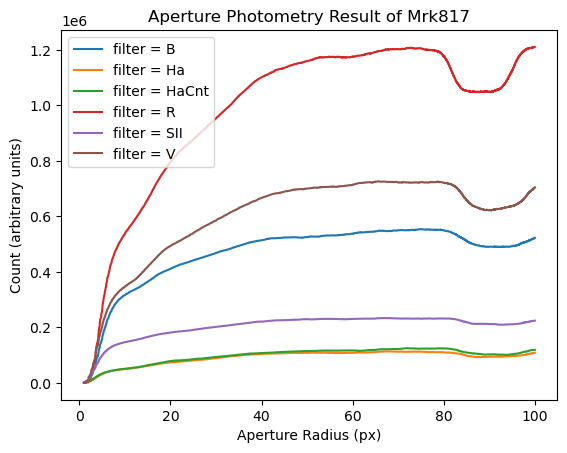

In [51]:
plt.plot(radius_range, Mrk817_stack_B_values, label="filter = B")
plt.plot(radius_range, Mrk817_Ha_values, label="filter = Ha")
plt.plot(radius_range, Mrk817_HaCnt_values, label="filter = HaCnt")
plt.plot(radius_range, Mrk817_stack_R_values, label="filter = R")
plt.plot(radius_range, Mrk817_SII_values, label="filter = SII")
plt.plot(radius_range, Mrk817_stack_V_values, label="filter = V")



plt.legend()
plt.title('Aperture Photometry Result of Mrk817')
plt.xlabel('Aperture Radius (px)')
plt.ylabel('Count (arbitrary units)')
plt.show()

In [52]:
# for Mrk6
Mrk6_stack_B_values, Mrk6_B_stack_visual = stacking_graph_and_visualization(Mrk6_names_filter[0], master_flat_B, aperture_pos_6_B, image_num = 2, reorient=False)
Mrk6_stack_Ha_values, Mrk6_Ha_stack_visual = stacking_graph_and_visualization(Mrk6_names_filter[1], master_flat_Ha, aperture_pos_6_Ha, image_num = 2, reorient=False)
Mrk6_stack_HaCnt_values, Mrk6_HaCnt_stack_visual = stacking_graph_and_visualization(Mrk6_names_filter[2], master_flat_HaCnt, aperture_pos_6_HaCnt, image_num = 2, reorient=False)
Mrk6_stack_R_values, Mrk6_R_stack_visual = stacking_graph_and_visualization(Mrk6_names_filter[3], master_flat_R, aperture_pos_6_R, image_num = 2, reorient=False)
Mrk6_stack_SII_values, Mrk6_SII_stack_visual = stacking_graph_and_visualization(Mrk6_names_filter[4], master_flat_SII, aperture_pos_6_SII, image_num = 2, reorient=False)
Mrk6_stack_V_values, Mrk6_V_stack_visual = stacking_graph_and_visualization(Mrk6_names_filter[5], master_flat_V, aperture_pos_6_V, image_num = 2, reorient=False)

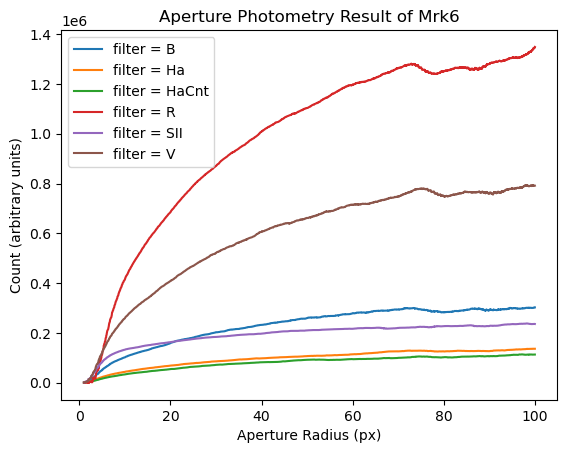

In [53]:
plt.plot(radius_range, Mrk6_stack_B_values, label="filter = B")
plt.plot(radius_range, Mrk6_stack_Ha_values, label="filter = Ha")
plt.plot(radius_range, Mrk6_stack_HaCnt_values, label="filter = HaCnt")
plt.plot(radius_range, Mrk6_stack_R_values, label="filter = R")
plt.plot(radius_range, Mrk6_stack_SII_values, label="filter = SII")
plt.plot(radius_range, Mrk6_stack_V_values, label="filter = V")
plt.legend()
plt.title('Aperture Photometry Result of Mrk6')
plt.xlabel('Aperture Radius (px)')
plt.ylabel('Count (arbitrary units)')
plt.show()

All three objects have a similar trend where count rises significantly along the smaller aperture radius, then slowed down as aperture radius rises. This trend is especially visible on R filter. This indicates the aperture is inside the object, and at the point where the rise slows down, the aperture begins to include the background. This indicates that in every filter, there is an optimal aperture size in order to fully encompass the object without including the background. In most of the filters, the optimal aperture radius is somewhere between 1 to 20 pixels.

Additionally, in some filters, the graph dips slighty. This is because some light of the neighbouring objects are included in the background annulus, where the count gets substracted. The graph rise again when the neighbouring objects are included in the circular aperture.

### Performing Magnitude Calculation
Apparent magnitude calculation will only be done for Mrk335, using most recent reference of Mihov & Slavcheva (2008). The magnitude is done in three filters: R, V, and B. The reference contains observation of reference stars in those filters. Here are the apparent magnitudes of the reference stars:

| Reference Star | B     | V     | R     |
|----------------|-------|-------|-------|
| A              | 15.42 | 14.25 | 13.70 |
| B              | 17.38 | 16.85 | 16.55 |
| C              | 15.43 | 15.00 | 14.78 |
| D              | 16.14 | 15.38 | 15.00 |

And here is the observation in V filter with annotated reference stars
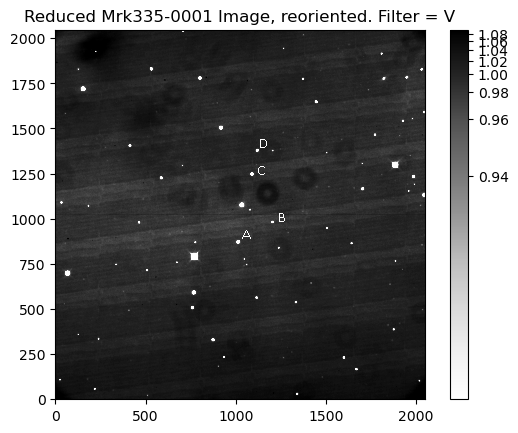

With the reference stars noted, the following is process to grab the reference stars position and aperture radius. The aperture radius is determined manually to fully contains the object while minimizing background. This might be different for every objects and filters as pixel size might differs. 

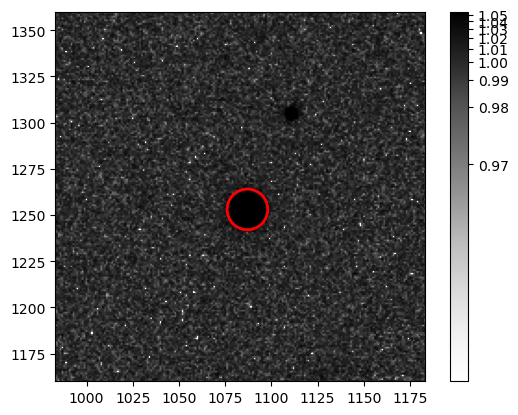

In [54]:
# %matplotlib notebook          
#this is only for grabbing the position by pointing. 
#comment the top line and restart the notebook kernel to reset the matplotlib




#for ease of reading, add the crosshair located at midpoint of image at (1024, 1024)
fig, ax = plt.subplots()
ax.plot()
# ax.axhline(y=1024, color='w')
# ax.axvline(x=1024, color = 'w')


data = Mrk335_R_stack_visual
positions = [(1087, 1253)]
aperture = CircularAperture(positions, r=11) #use r=5 to make small at first bigger to confirm
# annulus_aperture = CircularAnnulus(positions, r_in=10, r_out=15)

norm = simple_norm(data, 'log', percent=99)
plt.imshow(data, norm=norm, origin='lower', cmap='Greys')
plt.xlim(983, 1183)
plt.ylim(1160, 1360)
plt.colorbar()

ap_patches = aperture.plot(color='red', lw=2,
                           label='Photometry aperture')

plt.show()

In [55]:
#make a list the aperture position here
#Mrk335
Mrk335_data_B = [(1062, 1053), 15]
ref_A_mag_pos_radius_filter_B = [15.42, (1042, 847), 11]
ref_B_mag_pos_radius_filter_B = [17.38, (1233, 958), 8]
ref_C_mag_pos_radius_filter_B = [15.43, (1118, 1222), 11]
ref_D_mag_pos_radius_filter_B = [16.14, (1147, 1354), 9]

Mrk335_data_V = [(1033, 1075), 23]
ref_A_mag_pos_radius_filter_V = [14.25 ,(1014, 869), 14]
ref_B_mag_pos_radius_filter_V = [16.85, (1205, 979), 10]
ref_C_mag_pos_radius_filter_V = [15.00, (1091, 1244), 12]
ref_D_mag_pos_radius_filter_V = [15.38, (1119, 1376), 10]

Mrk335_data_R = [(1030, 1083), 30]
ref_A_mag_pos_radius_filter_R = [13.70, (1011, 878), 16]
ref_B_mag_pos_radius_filter_R = [16.55, (1088, 1252), 9]
ref_C_mag_pos_radius_filter_R = [14.78, (1087, 1253), 11]
ref_D_mag_pos_radius_filter_R = [15.00, (1116, 1383), 11]


Previously, it is determined that magnitude can be determined by the following equation:

$$
  m_{AGN}=m_{ref} -2.5 log\left ( \frac{count_1}{count_2} \right )
$$

a function is written to streamline the calculation

In [56]:
def calculate_magnitude(image, AGN_data, ref_data):
    
    #for the AGN
    image_data = image
    ap_position = AGN_data[0]
    ap_rad = AGN_data[1]
    
    aperture = CircularAperture(ap_position, r=ap_rad)
    AGN_phot_table = aperture_photometry(image_data, aperture)
    AGN_res = AGN_phot_table['aperture_sum']
    
                #bg substraction
    bg_apert = CircularAnnulus(ap_position, r_in = (1.2*ap_rad), r_out = (1.4*ap_rad)) 
    bg_apert_stats = ApertureStats(image, bg_apert)
    bg_mean = bg_apert_stats.mean
            
    ap_area = aperture.area
    total_bg = bg_mean*ap_area
    
                #subtract the value
    AGN_count = AGN_res - total_bg
    
    
    
    
    #for the reference star
    image_data = image
    
    ref_mag = ref_data[0]
    ap_position = ref_data[1]
    ap_rad = ref_data[2]
    
    aperture = CircularAperture(ap_position, r=ap_rad)
    ref_phot_table = aperture_photometry(image_data, aperture)
    ref_res = ref_phot_table['aperture_sum']
    
                #bg substraction
    bg_apert = CircularAnnulus(ap_position, r_in = (1.2*ap_rad), r_out = (1.4*ap_rad)) 
    bg_apert_stats = ApertureStats(image, bg_apert)
    bg_mean = bg_apert_stats.mean
            
    ap_area = aperture.area
    total_bg = bg_mean*ap_area
    
                #subtract the value
    ref_count = ref_res - total_bg
    
    
    
    log_term = np.log10(AGN_count/ref_count)
    
    return (ref_mag - (2.5*log_term))

Therefore, the apparent magnitudes are obtained as a mean average of calculation with all 4 reference stars. Note that inside the calculate_magnitude function, the image used is the image data of the stacked image and not the visualization.

In [57]:
AGN_mag_B = []
AGN_mag_B.append(calculate_magnitude(Mrk335_B_stack_data, Mrk335_data_B, ref_A_mag_pos_radius_filter_B))
AGN_mag_B.append(calculate_magnitude(Mrk335_B_stack_data, Mrk335_data_B, ref_B_mag_pos_radius_filter_B))
AGN_mag_B.append(calculate_magnitude(Mrk335_B_stack_data, Mrk335_data_B, ref_C_mag_pos_radius_filter_B))
AGN_mag_B.append(calculate_magnitude(Mrk335_B_stack_data, Mrk335_data_B, ref_D_mag_pos_radius_filter_B))

AGN_mag_V = []
AGN_mag_V.append(calculate_magnitude(Mrk335_V_stack_data, Mrk335_data_V, ref_A_mag_pos_radius_filter_V))
AGN_mag_V.append(calculate_magnitude(Mrk335_V_stack_data, Mrk335_data_V, ref_B_mag_pos_radius_filter_V))
AGN_mag_V.append(calculate_magnitude(Mrk335_V_stack_data, Mrk335_data_V, ref_C_mag_pos_radius_filter_V))
AGN_mag_V.append(calculate_magnitude(Mrk335_V_stack_data, Mrk335_data_V, ref_D_mag_pos_radius_filter_V))

AGN_mag_R = []
AGN_mag_R.append(calculate_magnitude(Mrk335_R_stack_data, Mrk335_data_R, ref_A_mag_pos_radius_filter_R))
AGN_mag_R.append(calculate_magnitude(Mrk335_R_stack_data, Mrk335_data_R, ref_B_mag_pos_radius_filter_R))
AGN_mag_R.append(calculate_magnitude(Mrk335_R_stack_data, Mrk335_data_R, ref_C_mag_pos_radius_filter_R))
AGN_mag_R.append(calculate_magnitude(Mrk335_R_stack_data, Mrk335_data_R, ref_D_mag_pos_radius_filter_R))


#### Printing the value
print()
print('Mrk 335 magnitude with reference star A')
print('in B wavelength = {}'.format(np.array(AGN_mag_B[0])))
print('in V wavelength = {}'.format(np.array(AGN_mag_V[0])))
print('in R wavelength = {}'.format(np.array(AGN_mag_R[0])))
print(' --------------- ')
print()
print('Mrk 335 magnitude with reference star B')
print('in B wavelength = {}'.format(np.array(AGN_mag_B[1])))
print('in V wavelength = {}'.format(np.array(AGN_mag_V[1])))
print('in R wavelength = {}'.format(np.array(AGN_mag_R[1])))
print(' --------------- ')
print()
print('Mrk 335 magnitude with reference star C')
print('in B wavelength = {}'.format(np.array(AGN_mag_B[2])))
print('in V wavelength = {}'.format(np.array(AGN_mag_V[2])))
print('in R wavelength = {}'.format(np.array(AGN_mag_R[2])))
print(' --------------- ')
print()
print('Mrk 335 magnitude with reference star D')
print('in B wavelength = {}'.format(np.array(AGN_mag_B[3])))
print('in V wavelength = {}'.format(np.array(AGN_mag_V[3])))
print('in R wavelength = {}'.format(np.array(AGN_mag_R[3])))
print(' --------------- ')
print()

print('Mean apparent magnitude of Mrk 335 in B wavelength = {}'.format(np.mean(np.array(AGN_mag_B))))
print('Mean apparent magnitude of Mrk 335 in V wavelength = {}'.format(np.mean(np.array(AGN_mag_V))))
print('Mean apparent magnitude of Mrk 335 in R wavelength = {}'.format(np.mean(np.array(AGN_mag_R))))


Mrk 335 magnitude with reference star A
in B wavelength = [15.26456317]
in V wavelength = [14.64357974]
in R wavelength = [14.1269189]
 --------------- 

Mrk 335 magnitude with reference star B
in B wavelength = [15.15871824]
in V wavelength = [14.60384247]
in R wavelength = [15.8342297]
 --------------- 

Mrk 335 magnitude with reference star C
in B wavelength = [15.20261485]
in V wavelength = [14.6287376]
in R wavelength = [14.09240467]
 --------------- 

Mrk 335 magnitude with reference star D
in B wavelength = [15.22088127]
in V wavelength = [14.63253238]
in R wavelength = [14.12274732]
 --------------- 

Mean apparent magnitude of Mrk 335 in B wavelength = 15.211694382461237
Mean apparent magnitude of Mrk 335 in V wavelength = 14.627173046176688
Mean apparent magnitude of Mrk 335 in R wavelength = 14.544075144073751


#### Obtaining Absolute Magnitude
Absolute magnitude can be obtained if the object has a prior observed redshift. Fortunately, Mihov & Slavcheva list the redshift of Mrk 335 to be $z = 0.02578$. Using the cosmological calculator from https://www.astro.ucla.edu/~wright/CosmoCalc.html, it is obtained that the luminosity distance of Mrk 335 is $d = 113.3 Mpc$ with parameters $H_o = 69.6 km/s/pc$, $\Omega_M = 0.286$, and  $\Omega_{vac} = 0.714$.

Assuming the distance modulus is equal to the luminosity distance, absolute magnitude can be obtained with the following equation:

$$
m-M = -5 + 5 log(d)
$$

where $m$ is apparent magnitude, $M$ is absolute magnitude, and $d$ is the distance in parsec.

In [58]:
#absolute magnitude calculation
def abs_mag_calc (app_mag, dist):
    res = (-5 + 5*np.log10(dist))-app_mag
    
    return -res

#### Printing the value
print('Mean absolute magnitude of Mrk 335 in B wavelength = {}'.format(abs_mag_calc(np.mean(np.array(AGN_mag_B)), 113.3*1000000)))
print('Mean absolute magnitude of Mrk 335 in V wavelength = {}'.format(abs_mag_calc(np.mean(np.array(AGN_mag_V)), 113.3*1000000)))
print('Mean absolute Magnitude of Mrk 335 in R wavelength = {}'.format(abs_mag_calc(np.mean(np.array(AGN_mag_R)), 113.3*1000000)))

Mean absolute magnitude of Mrk 335 in B wavelength = -20.05945516685574
Mean absolute magnitude of Mrk 335 in V wavelength = -20.643976503140294
Mean absolute Magnitude of Mrk 335 in R wavelength = -20.72707440524323


## Conclusion
In this project, it is shown that data reduction can be done fully in python with some python packages, with only little to no need for third-party software. Using this method, apparent and absolute magnitude calculation is performed. Comparing the obtained apparent magnitude for Mrk335 in visual wavelength, it is off by about 0.8 magnitude, which corresponds to around 6% error. 

### Reference
Doroshenko, V. T., Sergeev, S. G., Merkulova, N. I., Sergeeva, E. A., Golubinsky, Yu V., Pronik, V. I., & Okhmat, N. N. 2005a, Astrophysics, Vol. 48, No. 2.

Doroshenko, V. T., Sergeev, S. G., Merkulova, N. I., Sergeeva, E. A., Golubinsky, Yu V., Pronik, V. I., & Okhmat, N. N. 2005b, Astrophysics, Vol. 48, No. 3.

Doroshenko, V. T., Sergeev, S. G., Efimov, S. Yu., Nazarov, S., Pronik, V. I., Sergeeva, E. A., Sivtsov, G. A., 2007, Astrophysics, Vol. 50, No. 1.

Mihov, B. M., Slavcheva-Mihova, L. S., 2008, https://arxiv.org/abs/0711.1212v2.

Villata, M., Raiteri, C. M., Lanteri, L., Sobrito, G., Cavallone, M., 1998 A&A Suppl. Ser. 130: 305-310.

Webb, W., Malkan, M., 2000, ApJS, 130: 165-176

Widenhorn, R., Dunlap, J. C., Bodegom, E., (2010). IEEE Transactions on Electron Devices 57.3: 581-587. DOI: 10.1109/TED.2009.2038649